## **DOMAIN ADAPTATION ALGORITHMS EVALUATION**

In [ ]:
import os
import torch
import numpy as np
import soundfile as sf
import librosa
from tqdm import tqdm
import yaml
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.utils import resample
from scipy.stats import wasserstein_distance

In [ ]:
# Load audio processing constants from config.yaml
with open("config.yaml", "r") as f:
    config = yaml.safe_load(f)

SAMPLING_RATE = config["audio_processing"]["sampling_rate"] # Resample the audio files with frequency 4 kHz, since wheezes and crackles are typically within frequency range 0–2 kHz
FRAME_LENGTH = config["audio_processing"]["frame_length"] # Use window size of 60 ms for each cycle
HOP_LENGTH = config["audio_processing"]["hop_length"] # Use 50% overlap
N_MFCC = config["audio_processing"]["n_mfcc"] # Extract the first 13 MFCCs
N_MELS = config["audio_processing"]["n_mels"] # Use 64 Mel Banks to extract the Log-Mel Spectrograms
F_HI = config["audio_processing"]["f_hi"] # Boundary frequency for VLTP is set to 2 kHz
TARGET_DURATION = config["audio_processing"]["target_duration"] # Fix the duration of each cycle to 8 s

FRAME_SIZE = int(FRAME_LENGTH*SAMPLING_RATE) # Calculate the amount of samples per frame
HOP_SIZE = int(HOP_LENGTH*SAMPLING_RATE) #  Calculate the amount of samples per hop

# Load basic paths from config.yaml
RAW_CYCLE_FOLDER = os.path.join(os.getcwd(), config["paths"]["raw_cycle_folder"])
CLEANED_CYCLE_FOLDER = os.path.join(os.getcwd(), config["paths"]["cleaned_cycle_folder"])
FDA_TRAIN_FOLDER = os.path.join(os.getcwd(), config["paths"]["fda_train_folder"])
FDA_TEST_FOLDER = os.path.join(os.getcwd(), config["paths"]["fda_test_folder"])

os.makedirs(FDA_TRAIN_FOLDER, exist_ok=True)
os.makedirs(FDA_TEST_FOLDER, exist_ok=True)

# === Feature names ===
FEATURE_NAMES = (
    [f"MFCC_{i}" for i in range(N_MFCC)] +
    ["Spectral Centroid", "Spectral Bandwidth", "Zero Crossing Rate", "RMS Energy",
     "Spectral Rolloff", "Spectral Flux", "Spectral Flatness", "LogMel_Mean", "LogMel_Std"]
)

# Number of features used
N_FEATURES = len(FEATURE_NAMES) 

# Number of frames
N_FRAMES=267

# === Device names ===
DEVICES = ["AKGC417L", "LittC2SE", "Litt3200", "Meditron"]
REFERENCE_DEVICE = "AKGC417L"

In [5]:
# Load training and test sets
train_df = pd.read_csv("raw_training_set.csv")
final_train_df = pd.read_csv("training_set.csv")
test_df = pd.read_csv("test_set.csv")

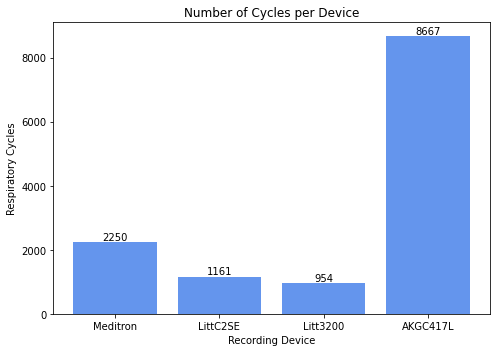

In [28]:
device_counts = Counter()

# Count the initial respiratory cycles of each device
for fname in os.listdir(CLEANED_CYCLE_FOLDER):
    if fname.endswith(".wav"):
        matched_device = next((d for d in DEVICES if d in fname), None)
        if matched_device:
            device_counts[matched_device] += 1

# Bar plot
plt.figure(figsize=(7, 5))
plt.bar(device_counts.keys(), device_counts.values(), color="cornflowerblue")
plt.title("Number of Cycles per Device")
plt.xlabel("Recording Device")
plt.ylabel("Respiratory Cycles")

for i, (device, count) in enumerate(device_counts.items()):
    plt.text(i, count + 1, str(count), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

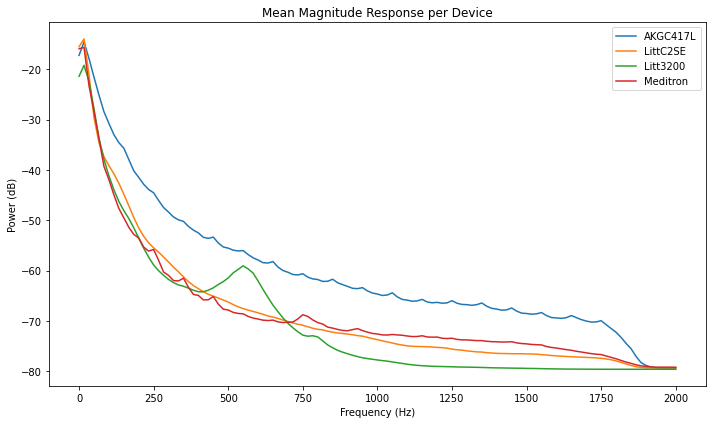

In [29]:
device_signals = {d: [] for d in DEVICES}

for fname in os.listdir(RAW_CYCLE_FOLDER):
    if fname.endswith(".wav"):
        device = next((d for d in DEVICES if d in fname), None)
        if device:
            y, _ = librosa.load(os.path.join(RAW_CYCLE_FOLDER, fname), sr=SAMPLING_RATE)
            device_signals[device].append(y)

# Calculate the mean magnitude response of each device
plt.figure(figsize=(10, 6))

for device in DEVICES:
    signals = device_signals[device]

    all_psd = []
    for y in signals:
        # STFT to Power Spectrogram
        S = np.abs(librosa.stft(y, n_fft=FRAME_SIZE, hop_length=HOP_SIZE))**2
        S_db = librosa.power_to_db(S, ref=np.max)
        mean_spectrum = np.mean(S_db, axis=1)  # Get mean value over time
        all_psd.append(mean_spectrum)

    avg_psd = np.mean(np.stack(all_psd), axis=0)
    freqs = librosa.fft_frequencies(sr=SAMPLING_RATE, n_fft=FRAME_SIZE)
    plt.plot(freqs, avg_psd, label=device)

plt.title("Mean Magnitude Response per Device")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Power (dB)")
plt.legend()
plt.tight_layout()
plt.show()

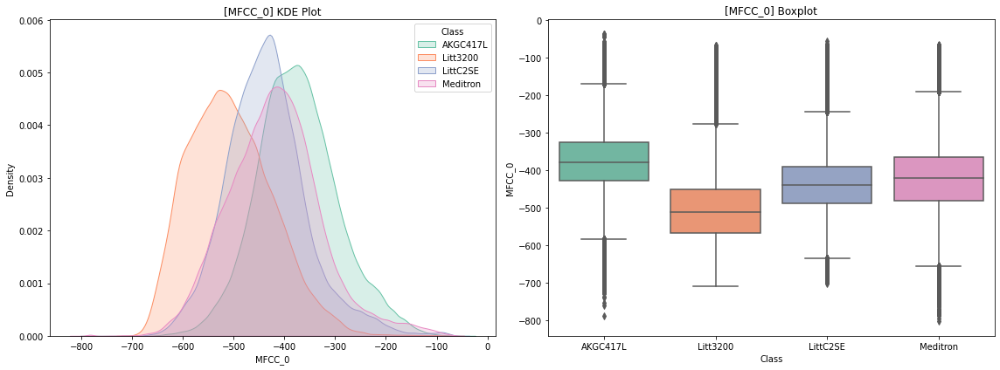

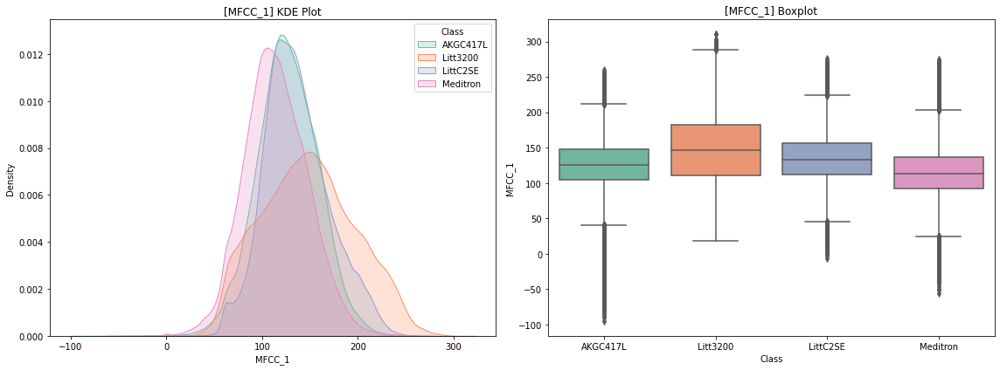

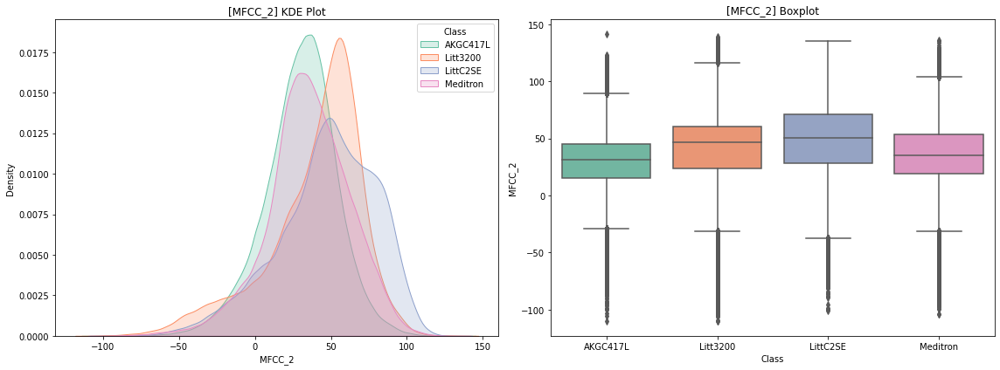

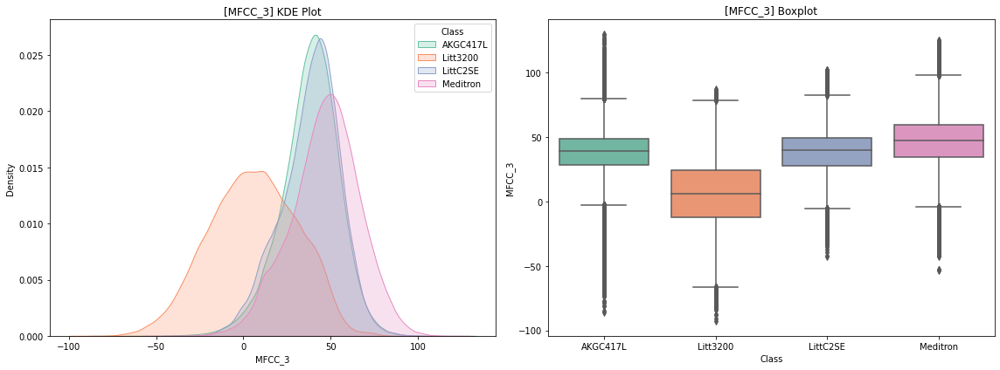

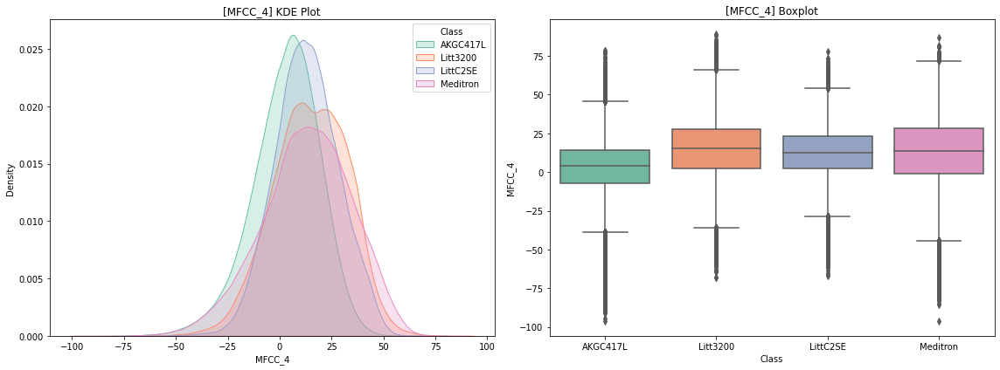

...

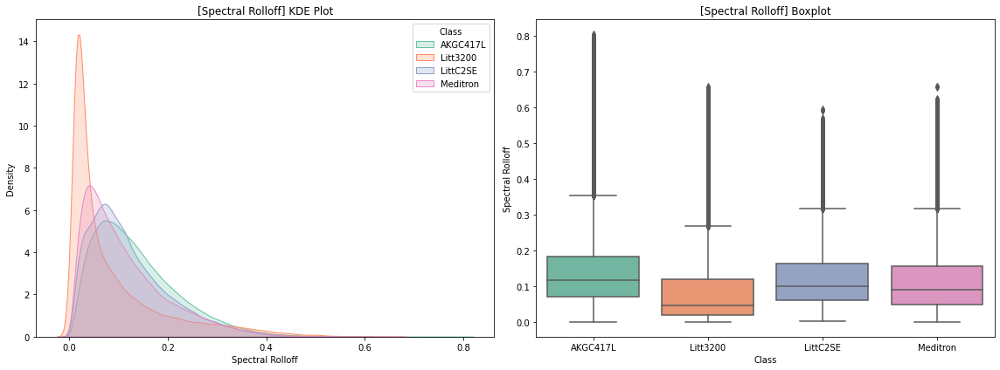

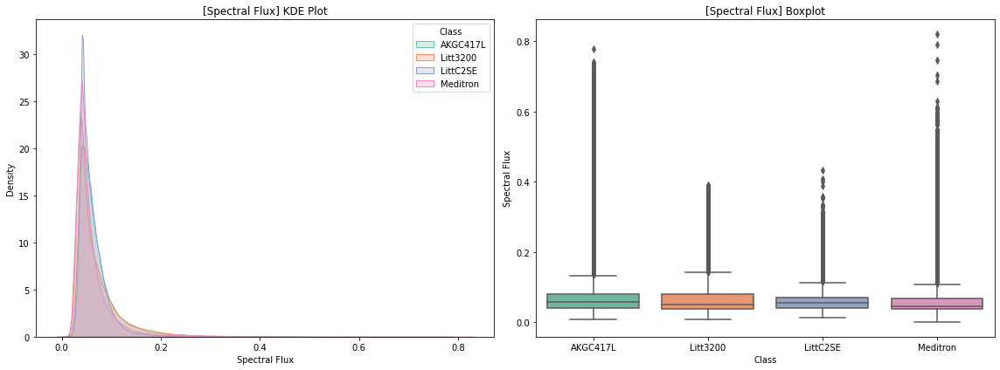

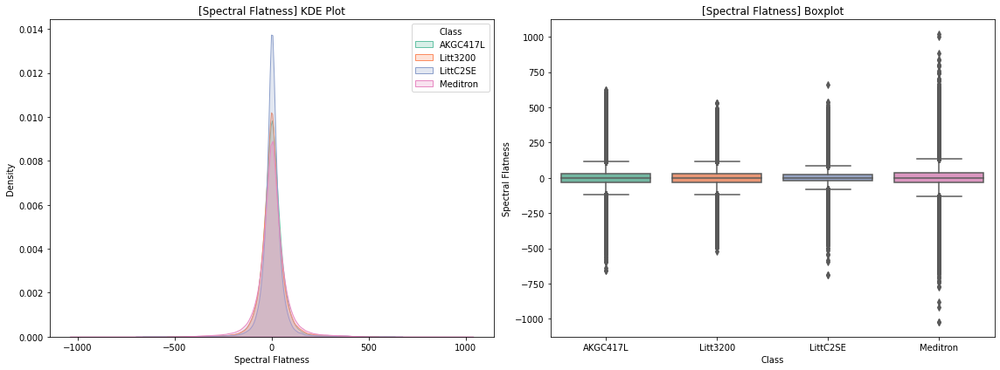

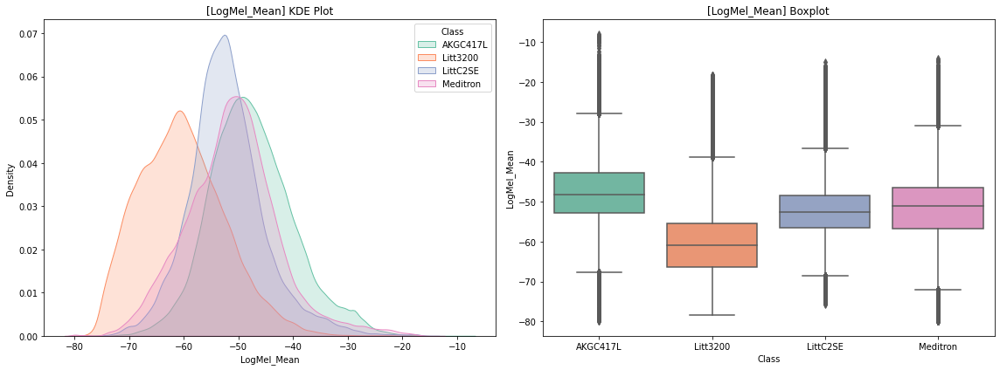

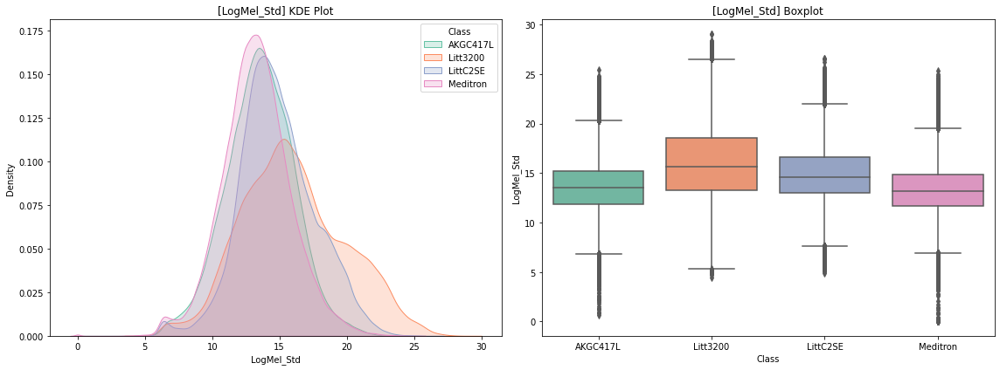

In [79]:
from utils.visuals_and_statistics_plots import plot_feature_distributions

# Load training set data
training_features = np.load("training_features.npy")  
device_labels = np.load("training_devices.npy")  

plot_feature_distributions(
    features=training_features,          
    labels=device_labels,             
    feature_names=FEATURE_NAMES,
    num_frames=N_FRAMES,
    label_palette="Set2"
)

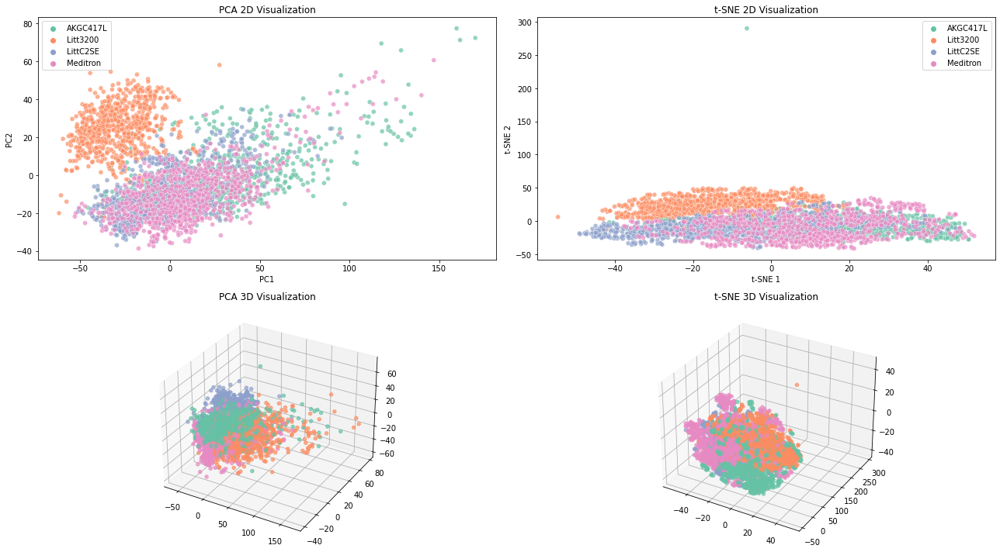

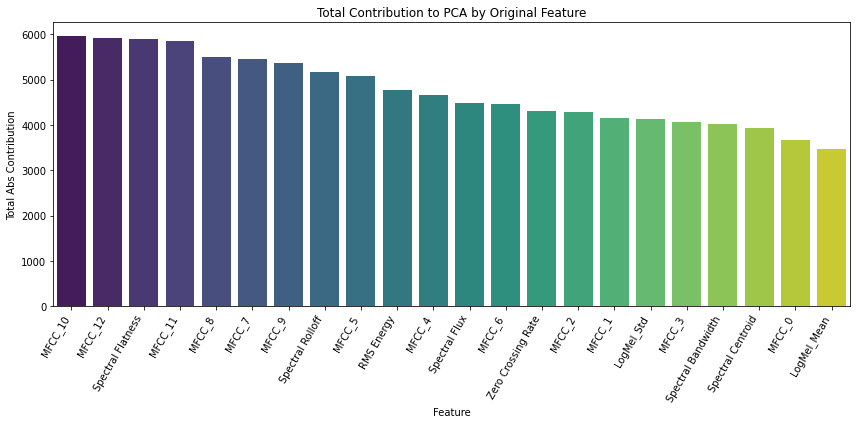

In [ ]:
from utils.statistics_and_visuals import perform_pca_and_tsne

# Count samples per device
device_counts = Counter(device_labels)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(device_labels):
    training_features_dev = training_features[device_labels == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

perform_pca_and_tsne(
    feature_matrix=balanced_training_features,
    labels=balanced_device_labels,
    pca_components=0.95, # Keep 95% of variance
    tsne_components=3,
    perplexity=30,
    n_features=N_FEATURES,
    feature_names=FEATURE_NAMES
)

In [9]:
le = LabelEncoder()
y = le.fit_transform(balanced_device_labels)
device_names = le.classes_

scaler = StandardScaler()
X = scaler.fit_transform(balanced_training_features)

clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Cross-validation 
scores = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')

# Evaluation
print("Accuracy per fold:", np.round(scores, 4))
print("Mean accuracy: {:.4f} ± {:.4f}".format(scores.mean(), scores.std()))

Accuracy per fold: [0.8706 0.8537 0.8648 0.8704 0.8761]
Mean accuracy: 0.8671 ± 0.0076


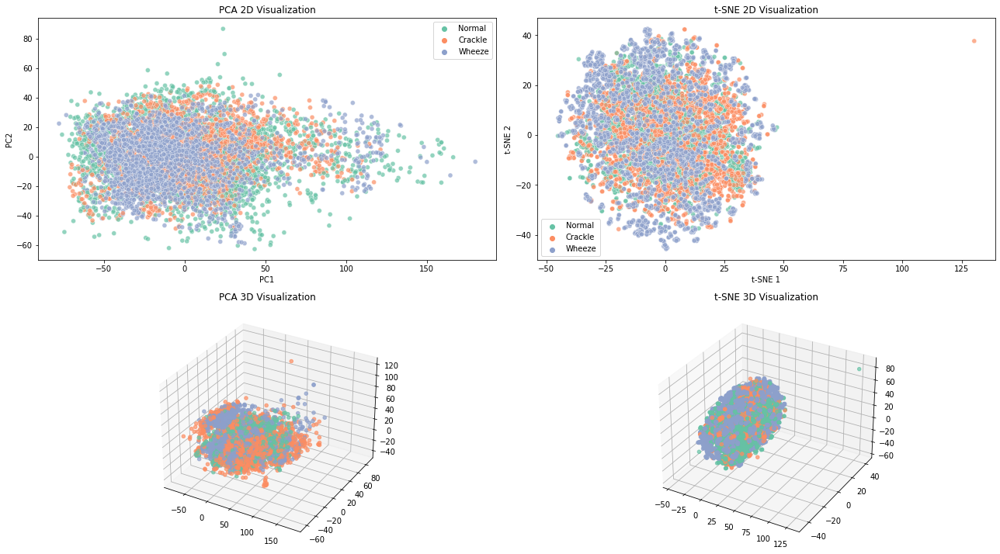

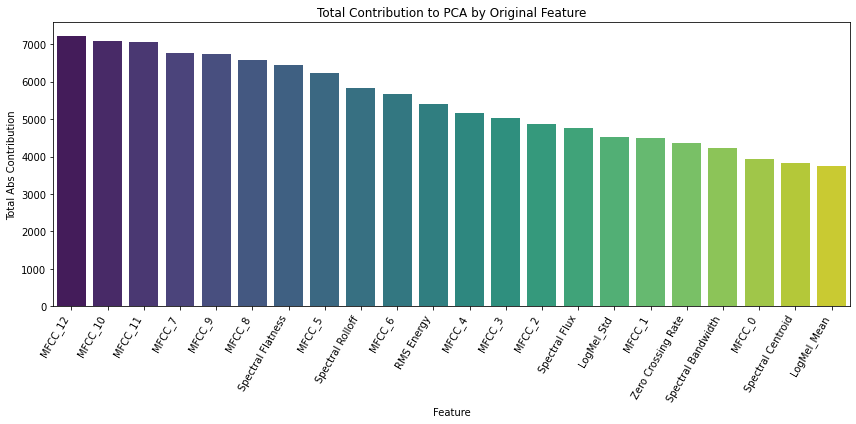

In [80]:
from utils.statistics_and_visuals import perform_pca_and_tsne

# Load training set data
training_features = np.load("training_features.npy")  
class_labels = np.load("training_labels.npy")  

# Keep only Normal, Crackle and Wheeze cycles
mask = np.isin(class_labels, ["Normal", "Crackle", "Wheeze"])
X = training_features[mask]
y = class_labels[mask]

perform_pca_and_tsne(
    feature_matrix=X,
    labels=y,
    pca_components=0.95, # Keep 95% of variance
    tsne_components=3,
    perplexity=30,
    n_features=N_FEATURES,
    feature_names=FEATURE_NAMES
)


Fold 1 Classification Report:
              precision    recall  f1-score   support

     Crackle       0.53      0.46      0.49       373
      Normal       0.65      0.79      0.72       729
      Wheeze       0.42      0.18      0.25       177

    accuracy                           0.61      1279
   macro avg       0.53      0.48      0.49      1279
weighted avg       0.58      0.61      0.59      1279

Confusion matrix:
[[171 185  17]
 [127 575  27]
 [ 27 118  32]]

Fold 2 Classification Report:
              precision    recall  f1-score   support

     Crackle       0.54      0.43      0.48       373
      Normal       0.64      0.80      0.71       729
      Wheeze       0.46      0.18      0.26       177

    accuracy                           0.61      1279
   macro avg       0.55      0.47      0.48      1279
weighted avg       0.59      0.61      0.58      1279

Confusion matrix:
[[161 199  13]
 [122 583  24]
 [ 16 129  32]]

Fold 3 Classification Report:
              pre

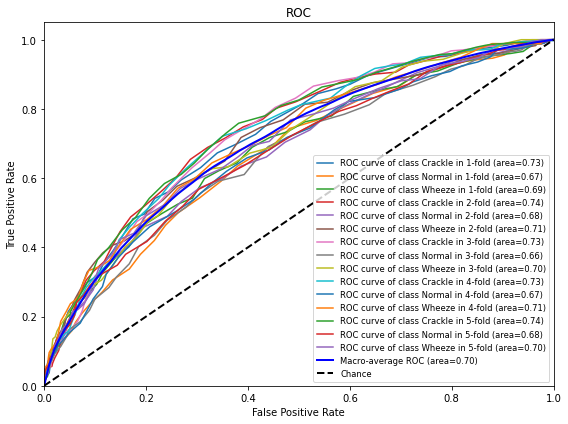

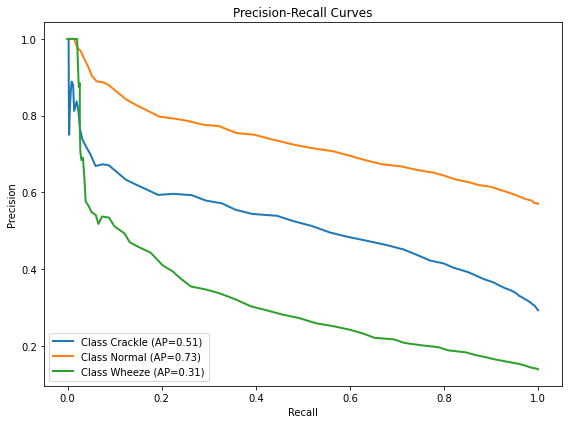


=== Overall Classification Report ===
              precision    recall  f1-score   support

     Crackle       0.52      0.42      0.47      1865
      Normal       0.64      0.80      0.71      3645
      Wheeze       0.44      0.17      0.24       885

    accuracy                           0.60      6395
   macro avg       0.54      0.46      0.47      6395
weighted avg       0.58      0.60      0.58      6395



In [ ]:
from utils.metrics import evaluate_multiclass_random_forest

X_train = np.load("training_features.npy")
y_train = np.load("training_labels.npy")
X_test = np.load("testing_features.npy")
y_test = np.load("testing_labels.npy")

evaluate_multiclass_random_forest(
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test
)


Fold 1 Report:
              precision    recall  f1-score   support

     Crackle       0.80      0.87      0.83       373
      Wheeze       0.66      0.55      0.60       177

    accuracy                           0.77       550
   macro avg       0.73      0.71      0.72       550
weighted avg       0.76      0.77      0.76       550

[[323  50]
 [ 79  98]]

Fold 2 Report:
              precision    recall  f1-score   support

     Crackle       0.81      0.86      0.83       373
      Wheeze       0.66      0.58      0.61       177

    accuracy                           0.77       550
   macro avg       0.73      0.72      0.72       550
weighted avg       0.76      0.77      0.76       550

[[320  53]
 [ 75 102]]

Fold 3 Report:
              precision    recall  f1-score   support

     Crackle       0.81      0.87      0.84       373
      Wheeze       0.68      0.56      0.62       177

    accuracy                           0.77       550
   macro avg       0.74      0.72 

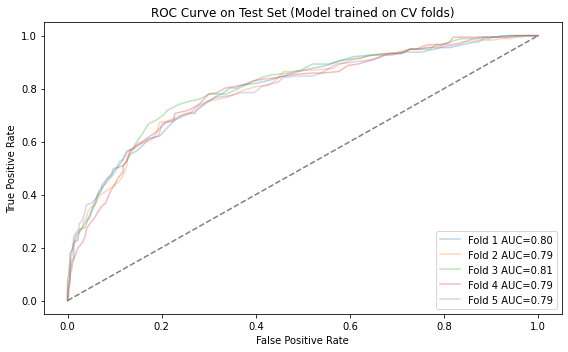


=== Overall Performance on Test Set ===
              precision    recall  f1-score   support

     Crackle       0.81      0.87      0.84      1865
      Wheeze       0.67      0.57      0.61       885

    accuracy                           0.77      2750
   macro avg       0.74      0.72      0.72      2750
weighted avg       0.76      0.77      0.76      2750

Average AUC: 0.7972705654261523


In [ ]:
from utils.statistics_and_visuals import evaluate_random_forest

# Binary classification: crackles vs wheezes
X_train = np.load("training_features.npy")
X_test = np.load("testing_features.npy")

y_train = np.load("training_labels.npy")
y_test = np.load("testing_labels.npy")

evaluate_random_forest(
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    positive_label="Wheeze",
    negative_label="Crackle"
)

### **SPECTRUM CORRECTION**

In [109]:
from domain_adaptation_algorithms.spectrum_correction import *

# Get the files of the training test for each recording device 
devices = ["AKGC417L", "LittC2SE", "Litt3200", "Meditron"]
device_segments = {d: [] for d in devices}
device_files = {d: [] for d in devices}

for fname in train_df["file"]:
    device = next((d for d in devices if d in fname), None)
    if device:
        path = os.path.join(RAW_CYCLE_FOLDER, fname)
        y, _ = librosa.load(path, sr=SAMPLING_RATE)
        device_segments[device].append(y)
        device_files[device].append((fname, y))

# Find common (aligned) segments
min_files = min(len(device_segments[d]) for d in devices)
aligned_segments = [
    {device: device_segments[device][i] for device in devices}
    for i in range(min_files)
]

# Fit Spectrum Correction on raw .wav files of training set
correction = SpectrumCorrection(num_fft=FRAME_SIZE, hop_length=HOP_SIZE)
correction.fit(aligned_segments, reference=REFERENCE_DEVICE)

In [24]:
SC_TRAIN_FOLDER = "corrected_train_sc"
os.makedirs(SC_TRAIN_FOLDER, exist_ok=True)

device_segments = {d: [] for d in devices}
device_files = {d: [] for d in devices}

for fname in final_train_df["file"]:
    device = next((d for d in devices if d in fname), None)
    if device:
        path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
        y, _ = librosa.load(path, sr=SAMPLING_RATE)
        device_segments[device].append(y)
        device_files[device].append((fname, y))

# Find common (aligned) segments
min_files = min(len(device_segments[d]) for d in devices)
aligned_segments = [
    {device: device_segments[device][i] for device in devices}
    for i in range(min_files)
]

# Apply Spectrum Correction only on non-reference devices of preprocessed training set 
for fname in final_train_df["file"]:
    device = next((d for d in devices if d in fname), None)
    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(SC_TRAIN_FOLDER, fname)

    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)
    if device != REFERENCE_DEVICE:
        y = correction.transform_wave(y, device)

    sf.write(output_path, y, SAMPLING_RATE)

In [25]:
SC_TEST_FOLDER = "corrected_test_sc"
os.makedirs(SC_TEST_FOLDER, exist_ok=True)

# Apply Spectrum Correction only on non-reference devices of testing set 
for fname in test_df["file"]:
    device = next((d for d in devices if d in fname), None)
    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(SC_TEST_FOLDER, fname)

    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)
    if device != REFERENCE_DEVICE:
        y = correction.transform_wave(y, device)

    sf.write(output_path, y, SAMPLING_RATE)

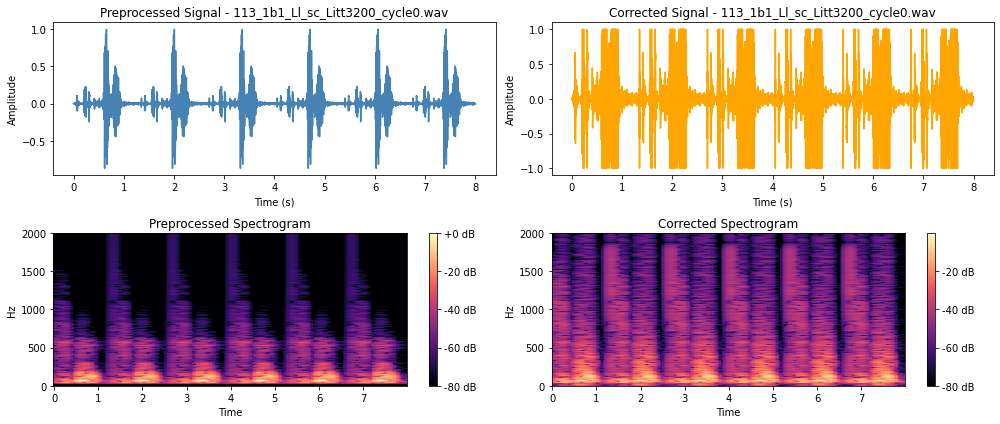

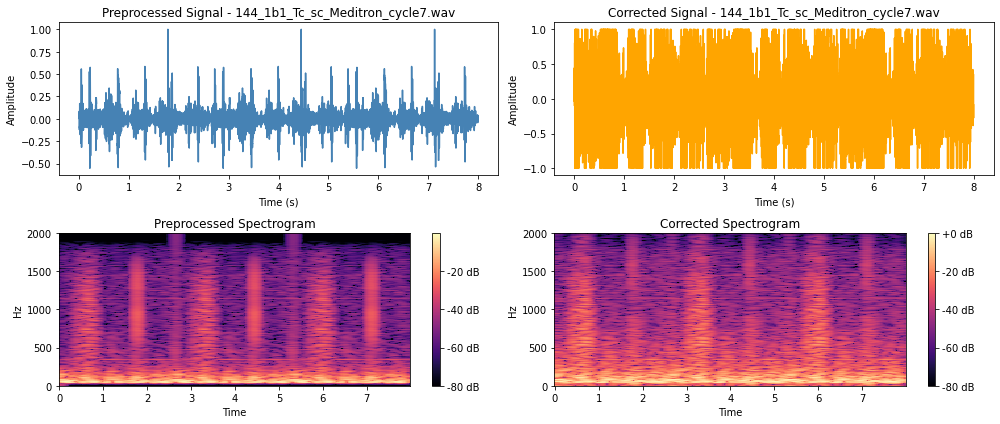

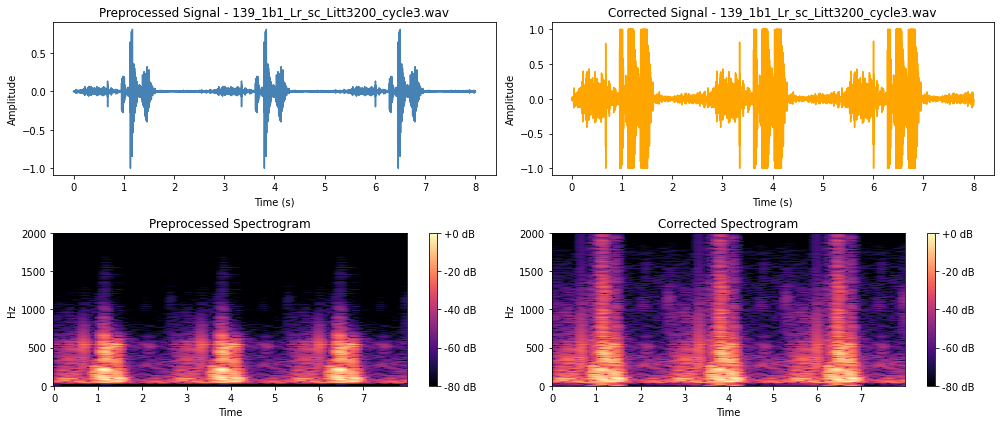

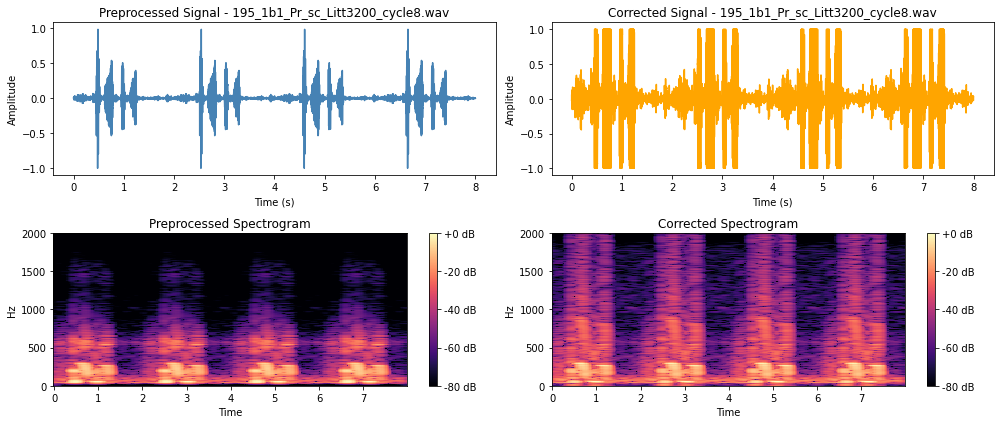

In [31]:
from utils.statistics_and_visuals import plot_signals_after_spectrum_correction

# Get the first 4 .wav files that do not originate from the refernece device and plot them
non_ref_train_files = final_train_df[~final_train_df["file"].str.contains("AKGC417L")]["file"].tolist()[:4]

plot_signals_after_spectrum_correction(
    file_list=non_ref_train_files,
    cleaned_folder=CLEANED_CYCLE_FOLDER,
    corrected_folder=SC_TRAIN_FOLDER,
    sampling_rate=SAMPLING_RATE,
    hop_size=HOP_SIZE
)

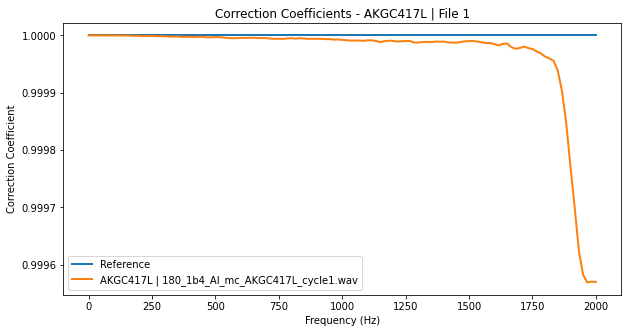

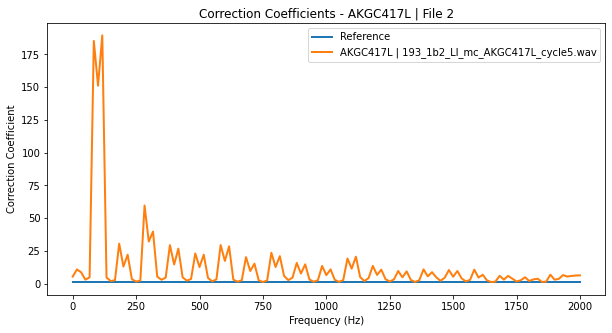

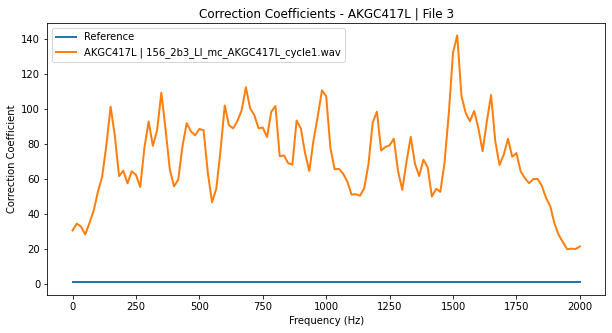

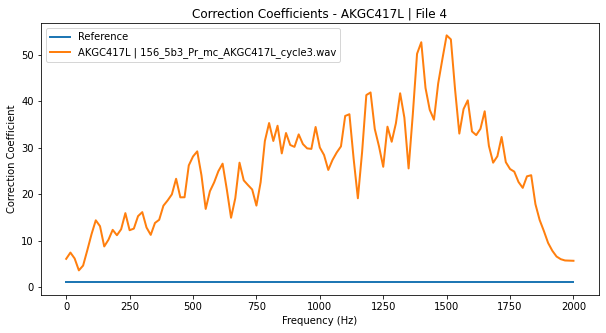

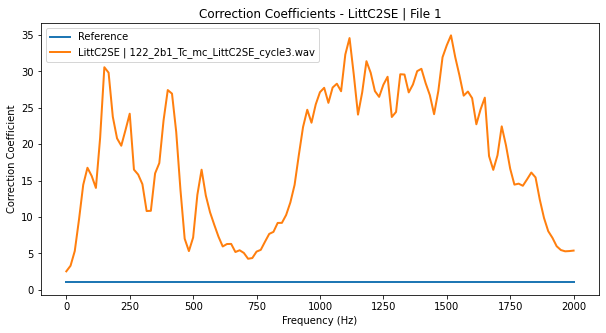

...

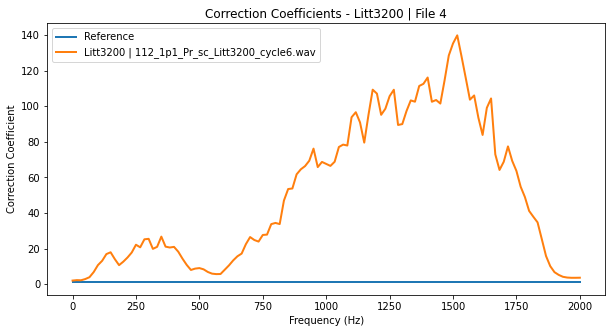

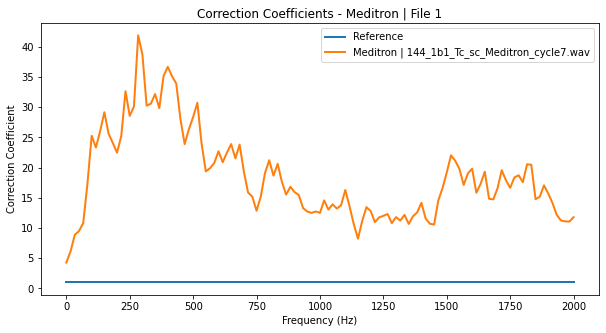

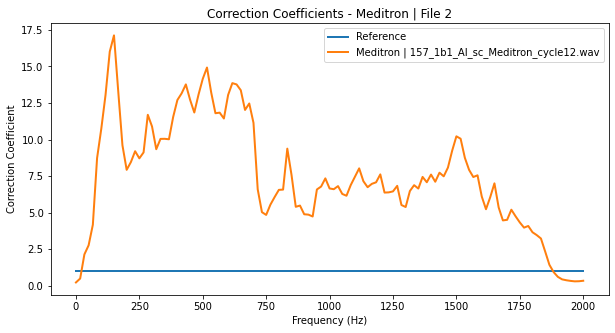

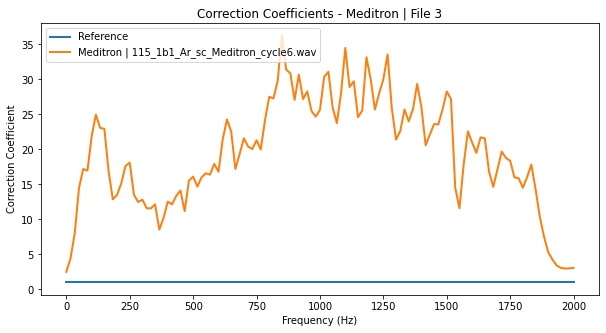

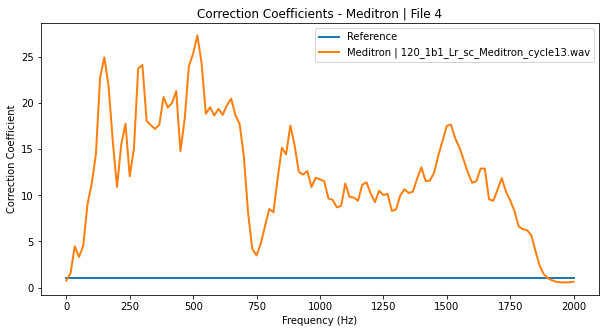

In [110]:
# Plot the correction coefficients for the first 4 files of each refrence device
correction.plot_correction_coefficients(
    device_files=device_files,
    reference_device=REFERENCE_DEVICE,
    k=4,
    sr=SAMPLING_RATE
)

In [33]:
from utils.audio_preprocessing import extract_acoustic_features

# Mapping filename to label 
filename_to_label = dict(zip(final_train_df["file"], final_train_df["class"]))

train_feature_list = []
train_filename_list = []
train_label_list = []

train_wav_files = [f for f in os.listdir(SC_TRAIN_FOLDER) if f.endswith(".wav")]

for fname in tqdm(train_wav_files, desc="Extracting features from corrected training set"):
    path = os.path.join(SC_TRAIN_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    train_feature_list.append(feats.flatten())
    train_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    train_label_list.append(label)

# Convert to arrays
train_features_array = np.vstack(train_feature_list)
train_filenames_array = np.array(train_filename_list)
train_labels_array = np.array(train_label_list)

np.save("training_features_sc.npy", train_features_array)
np.save("training_filenames_sc.npy", train_filenames_array)
np.save("training_labels_sc.npy", train_labels_array)

Extracting features from corrected training set: 100%|██████████| 11652/11652 [06:35<00:00, 29.48it/s]


In [34]:
from utils.audio_preprocessing import extract_acoustic_features

# Mapping filename to label 
filename_to_label = dict(zip(test_df["file"], test_df["class"]))

test_feature_list = []
test_filename_list = []
test_label_list = []

test_wav_files = [f for f in os.listdir(SC_TEST_FOLDER) if f.endswith(".wav")]

for fname in tqdm(test_wav_files, desc="Extracting features from corrected test set"):
    path = os.path.join(SC_TEST_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    test_feature_list.append(feats.flatten())
    test_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    test_label_list.append(label)

# Convert to arrays 
test_features_array = np.vstack(test_feature_list)
test_filenames_array = np.array(test_filename_list)
test_labels_array = np.array(test_label_list)

np.save("test_features_sc.npy", test_features_array)
np.save("test_filenames_sc.npy", test_filenames_array)
np.save("test_labels_sc.npy", test_labels_array)

Extracting features from corrected test set: 100%|██████████| 1380/1380 [01:25<00:00, 16.14it/s]


In [35]:
from utils.metrics import coral_distance

# Load the features before and after spectrum correction
x_before = np.load("training_features.npy")                  
x_after = np.load("training_features_sc.npy")        
devices = np.load("training_devices.npy", allow_pickle=True) 

results = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue
    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    # Calculate the CORAL distance of the 3 remaining devices from AKGC417L 
    dist_before = coral_distance(X_src_before, X_trg_before)
    dist_after  = coral_distance(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"CORAL distance before: {vals['before']:.2e}")
    print(f"CORAL distance after: {vals['after']:.2e}")
    print(f"CORAL distance relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[LittC2SE → AKGC417L]
CORAL distance before: 1.06e+14
CORAL distance after: 2.71e+12
CORAL distance relevant reduction: 97.43%

[Litt3200 → AKGC417L]
CORAL distance before: 2.03e+14
CORAL distance after: 8.55e+12
CORAL distance relevant reduction: 95.78%

[Meditron → AKGC417L]
CORAL distance before: 1.48e+13
CORAL distance after: 4.50e+12
CORAL distance relevant reduction: 69.71%



In [ ]:
from utils.metrics import mean_wasserstein

# Results per device
results = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue

    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    # Calculate the Wasserstein  distance of the 3 remaining devices from AKGC417L 
    dist_before = mean_wasserstein(X_src_before, X_trg_before)
    dist_after  = mean_wasserstein(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"Wasserstein distance before: {vals['before']:.4f}")
    print(f"Wasserstein distance after:  {vals['after']:.4f}")
    print(f"Wasserstein relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[LittC2SE → AKGC417L]
Wasserstein distance before: 17.7895
Wasserstein distance after:  2.2828
Wasserstein relevant reduction: 87.17%

[Litt3200 → AKGC417L]
Wasserstein distance before: 23.9789
Wasserstein distance after:  3.2350
Wasserstein relevant reduction: 86.51%

[Meditron → AKGC417L]
Wasserstein distance before: 8.9944
Wasserstein distance after:  1.7314
Wasserstein relevant reduction: 80.75%



Use 502 cycles (Litt3200) from each device for balanced PCA/t-SNE to remove the bias from AKGC417L.

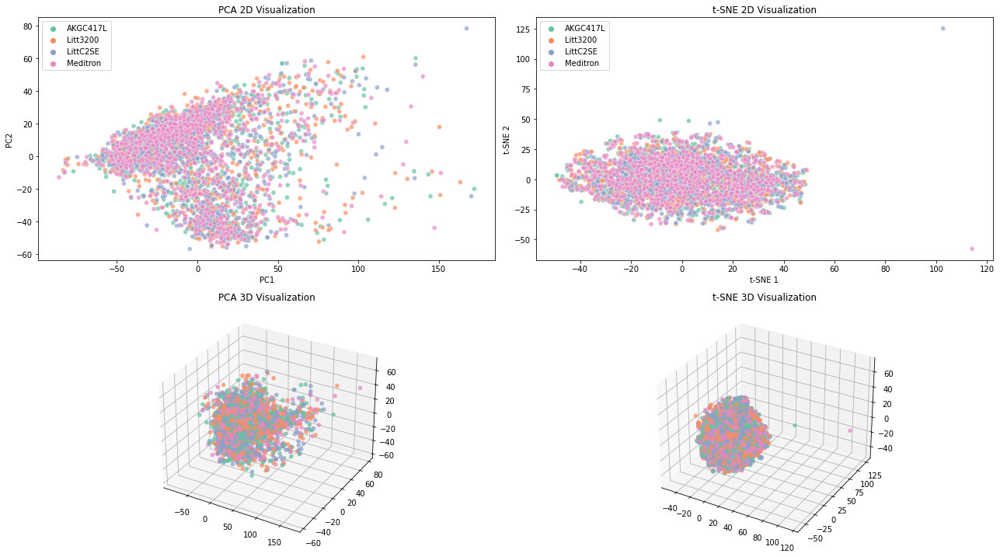

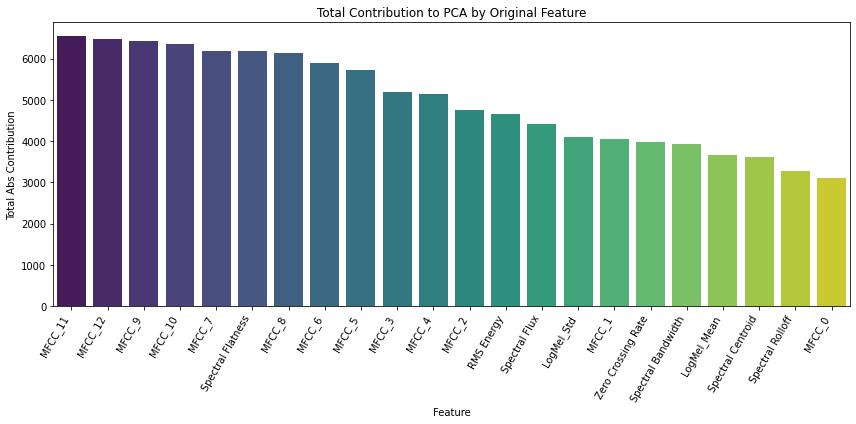

In [ ]:
from utils.statistics_and_visuals import perform_pca_and_tsne

# Load the corrected training set data
training_features = np.load("training_features_sc.npy")  
device_labels = np.load("training_devices.npy")   

# Count samples per device
device_counts = Counter(device_labels)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(device_labels):
    training_features_dev = training_features[device_labels == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

perform_pca_and_tsne(
    feature_matrix=balanced_training_features,
    labels=balanced_device_labels,
    pca_components=0.95, # Keep 95% of variance
    tsne_components=3,
    perplexity=30,
    n_features=N_FEATURES,
    feature_names=FEATURE_NAMES
)

In [55]:
le = LabelEncoder()
y = le.fit_transform(balanced_device_labels)
device_names = le.classes_

scaler = StandardScaler()
X = scaler.fit_transform(balanced_training_features)

clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Cross-validation 
scores = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')

# Evaluation
print("Accuracy per fold:", np.round(scores, 4))
print("Mean accuracy: {:.4f} ± {:.4f}".format(scores.mean(), scores.std()))

Accuracy per fold: [0.2954 0.2743 0.2507 0.2592 0.2831]
Mean accuracy: 0.2725 ± 0.0161


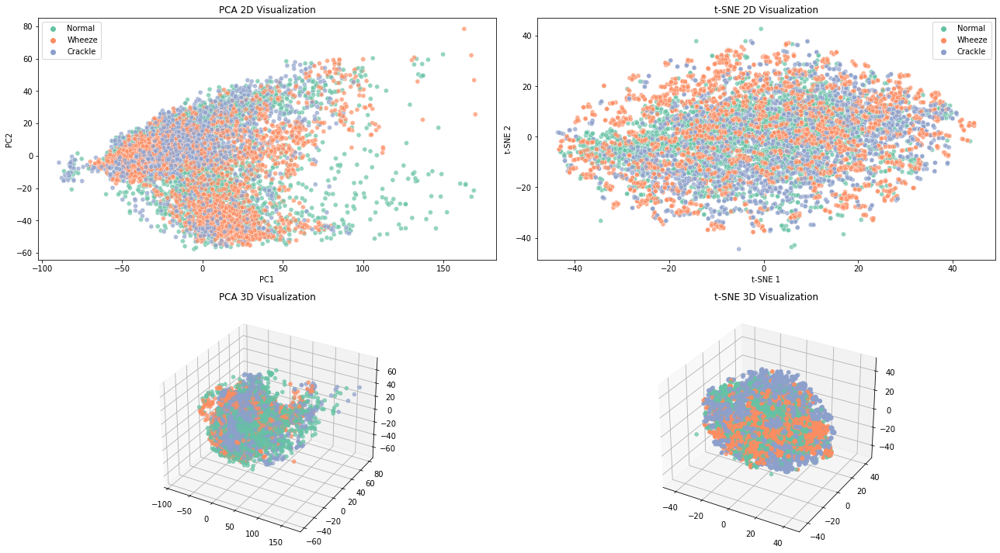

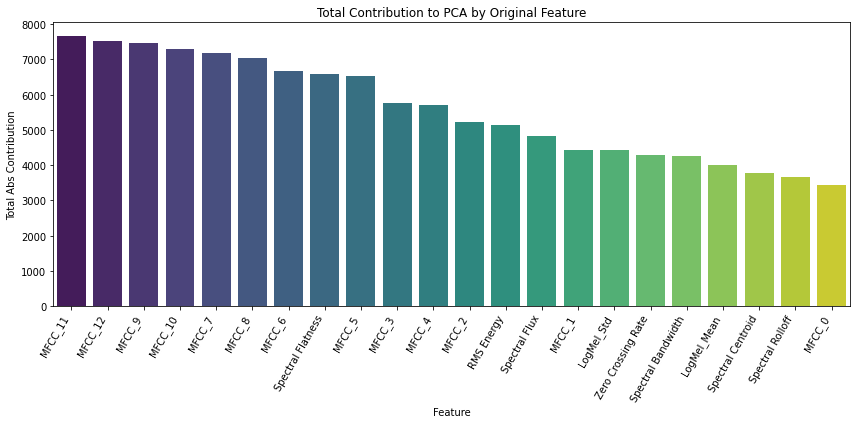

In [61]:
from utils.statistics_and_visuals import perform_pca_and_tsne

# Load the corrected training set data
training_features = np.load("training_features_sc.npy")  
class_labels = np.load("training_labels_sc.npy")  

# Keep only Normal, Crackle and Wheeze cycles
mask = np.isin(class_labels, ["Normal", "Crackle", "Wheeze"])
X = training_features[mask]
y = class_labels[mask]

perform_pca_and_tsne(
    feature_matrix=X,
    labels=y,
    pca_components=0.95, # Keep 95% of variance
    tsne_components=3,
    perplexity=30,
    n_features=N_FEATURES,
    feature_names=FEATURE_NAMES
)


Fold 1 Classification Report:
              precision    recall  f1-score   support

     Crackle       0.59      0.61      0.60       373
      Normal       0.70      0.77      0.74       729
      Wheeze       0.46      0.24      0.32       177

    accuracy                           0.65      1279
   macro avg       0.58      0.54      0.55      1279
weighted avg       0.64      0.65      0.64      1279

Confusion matrix:
[[227 135  11]
 [126 563  40]
 [ 32 102  43]]

Fold 2 Classification Report:
              precision    recall  f1-score   support

     Crackle       0.58      0.61      0.60       373
      Normal       0.69      0.77      0.73       729
      Wheeze       0.44      0.18      0.26       177

    accuracy                           0.64      1279
   macro avg       0.57      0.52      0.53      1279
weighted avg       0.63      0.64      0.63      1279

Confusion matrix:
[[229 140   4]
 [129 563  37]
 [ 36 109  32]]

Fold 3 Classification Report:
              pre

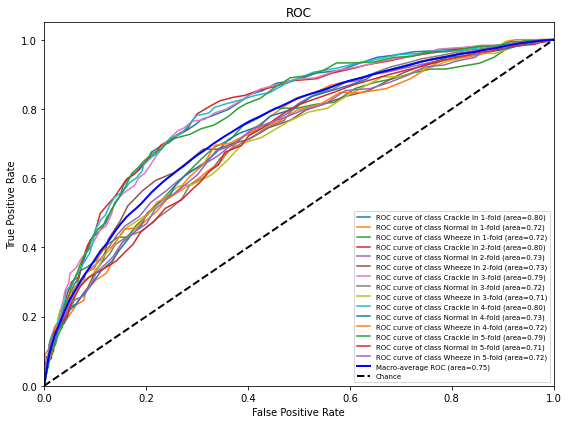

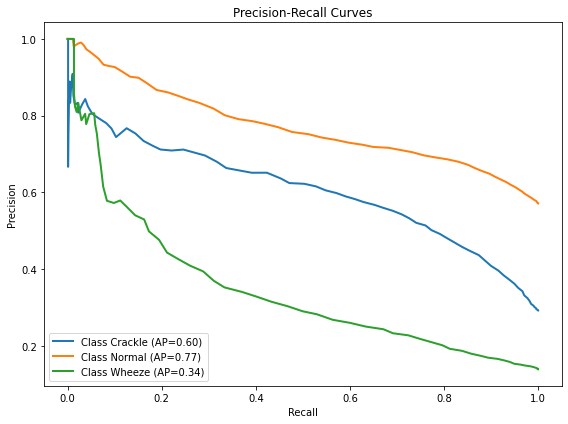


=== Overall Classification Report ===
              precision    recall  f1-score   support

     Crackle       0.58      0.62      0.60      1865
      Normal       0.70      0.77      0.73      3645
      Wheeze       0.45      0.21      0.29       885

    accuracy                           0.65      6395
   macro avg       0.58      0.53      0.54      6395
weighted avg       0.63      0.65      0.63      6395



In [ ]:
from utils.metrics import evaluate_multiclass_random_forest

X_train = np.load("training_features_sc.npy")
y_train = np.load("training_labels_sc.npy")
X_test = np.load("test_features_sc.npy")
y_test = np.load("test_labels_sc.npy")

evaluate_multiclass_random_forest(
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test
)

### **FOURIER DOMAIN ADAPTATION**

In [67]:
from domain_adaptation_algorithms.fourier_domain_adaptation import *

FDA_TRAIN_FOLDER = "fda_corrected_train"
os.makedirs(FDA_TRAIN_FOLDER, exist_ok=True)

L = 0.01  # Set FDA intensity

file_list = final_train_df["file"].tolist()

# Calculate mean spectrogram of AKGC417L
reference_specs = []
for fname in file_list:
    if REFERENCE_DEVICE in fname:
        path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
        if os.path.exists(path):
            y, _ = librosa.load(path, sr=SAMPLING_RATE)
            spec = librosa.stft(y, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
            mag = np.abs(spec)
            norm = (mag - np.mean(mag)) / (np.std(mag) + 1e-6)
            reference_specs.append(norm)
mean_ref_spec = np.mean(reference_specs, axis=0)
mean_ref_tensor = torch.tensor(mean_ref_spec, dtype=torch.float32).unsqueeze(0).unsqueeze(0)

# Apply FDA on preprocessed training set 
for fname in tqdm(file_list, desc="Applying FDA on training set"):
    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(FDA_TRAIN_FOLDER, fname)
    device = next((d for d in DEVICES if d in fname), None)

    if not os.path.exists(input_path):
        print(f"[!] Missing: {input_path}")
        continue

    try:
        y, _ = librosa.load(input_path, sr=SAMPLING_RATE)

        if device == REFERENCE_DEVICE:
            sf.write(output_path, y, SAMPLING_RATE)
            continue

        src_tensor, src_phase, orig_len = wav_to_stft_tensor(y, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
        adapted_tensor = FDA_source_to_target(src_tensor, mean_ref_tensor, L)
        y_corrected = stft_tensor_to_wav(adapted_tensor, src_phase, orig_len, hop_length=HOP_SIZE)
        sf.write(output_path, y_corrected, SAMPLING_RATE)

    except Exception as e:
        print(f"[X] Failed on {fname}: {e}")

Applying FDA on training set: 100%|██████████| 11652/11652 [03:20<00:00, 58.12it/s]


In [68]:
from domain_adaptation_algorithms.fourier_domain_adaptation import *

FDA_TEST_FOLDER = "corrected_test_fda"
os.makedirs(FDA_TEST_FOLDER, exist_ok=True)

file_list = test_df["file"].tolist()

# Calculate mean spectrogram of AKGC417L in test set 
reference_specs = []
for fname in file_list:
    if REFERENCE_DEVICE in fname:
        path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
        if os.path.exists(path):
            y, _ = librosa.load(path, sr=SAMPLING_RATE)
            spec = librosa.stft(y, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
            mag = np.abs(spec)
            norm = (mag - np.mean(mag)) / (np.std(mag) + 1e-6)
            reference_specs.append(norm)
mean_ref_spec = np.mean(reference_specs, axis=0)
mean_ref_tensor = torch.tensor(mean_ref_spec, dtype=torch.float32).unsqueeze(0).unsqueeze(0) # Reshape the mean AKGC417L spectrogram into tensor 

# Apply FDA on test set
for fname in tqdm(file_list, desc="Applying FDA on test set"):
    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(FDA_TEST_FOLDER, fname)
    device = next((d for d in DEVICES if d in fname), None)

    if not os.path.exists(input_path):
        print(f"[!] Missing: {input_path}")
        continue

    try:
        y, _ = librosa.load(input_path, sr=SAMPLING_RATE)

        if device == REFERENCE_DEVICE:
            sf.write(output_path, y, SAMPLING_RATE)
            continue

        src_tensor, src_phase, orig_len = wav_to_stft_tensor(y, n_fft=FRAME_SIZE, hop_length=HOP_SIZE) # Get source domain tensors
        adapted_tensor = FDA_source_to_target(src_tensor, mean_ref_tensor, L) # Adapt the source tensors on the reference tensor
        y_corrected = stft_tensor_to_wav(adapted_tensor, src_phase, orig_len, hop_length=HOP_SIZE) # Reshape the adapted source tensor back into .wav file
        sf.write(output_path, y_corrected, SAMPLING_RATE)

    except Exception as e:
        print(f"[X] Failed on {fname}: {e}")

Applying FDA on test set: 100%|██████████| 1380/1380 [00:28<00:00, 48.10it/s]


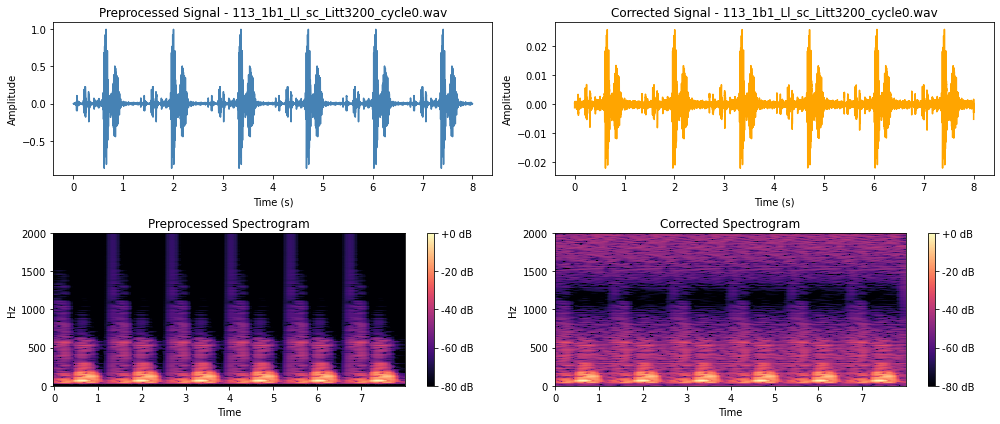

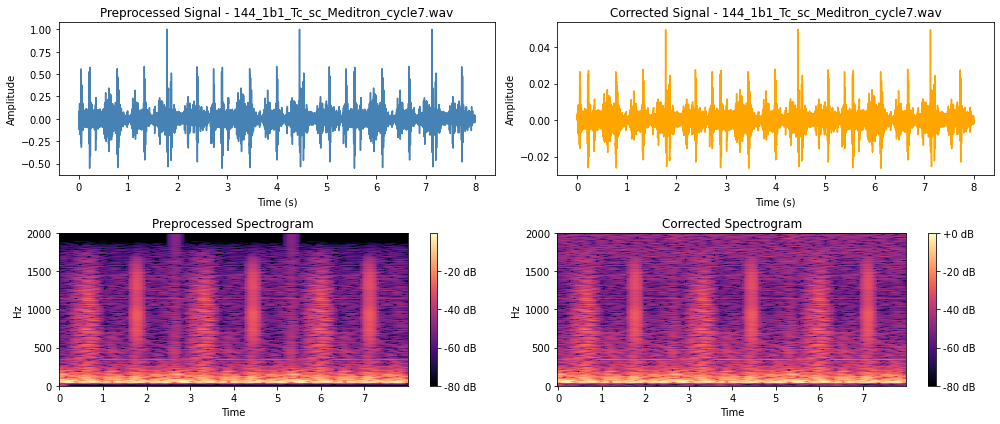

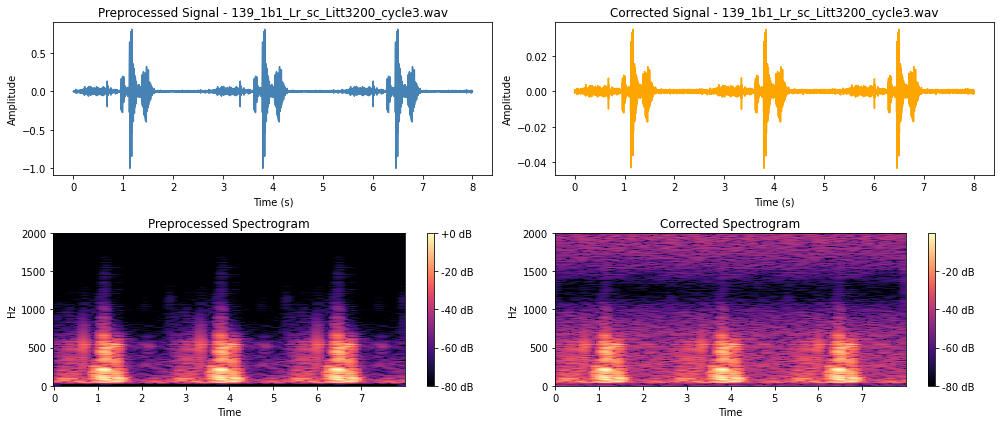

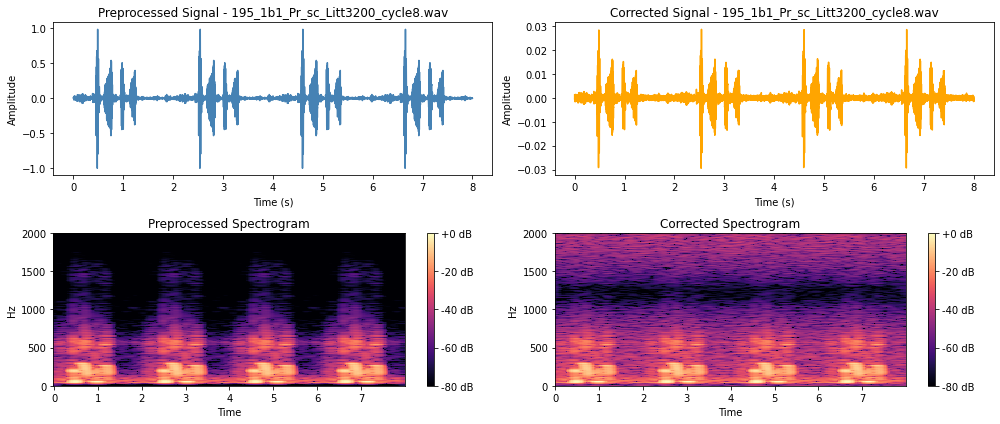

In [69]:
from utils.statistics_and_visuals import plot_signals_after_spectrum_correction

# Get the first 4 .wav files that do not originate from the refernece device and plot them
non_ref_train_files = final_train_df[~final_train_df["file"].str.contains("AKGC417L")]["file"].tolist()[:4]

plot_signals_after_spectrum_correction(
    file_list=non_ref_train_files,
    cleaned_folder=CLEANED_CYCLE_FOLDER,
    corrected_folder=FDA_TRAIN_FOLDER,
    sampling_rate=SAMPLING_RATE,
    hop_size=HOP_SIZE
)

In [70]:
from utils.audio_preprocessing import extract_acoustic_features

# Mapping filename to label 
filename_to_label = dict(zip(final_train_df["file"], final_train_df["class"]))

train_feature_list = []
train_filename_list = []
train_label_list = []

train_wav_files = [f for f in os.listdir(FDA_TRAIN_FOLDER) if f.endswith(".wav")]

for fname in tqdm(train_wav_files, desc="Extracting features from corrected training set"):
    path = os.path.join(FDA_TRAIN_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    train_feature_list.append(feats.flatten())
    train_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    train_label_list.append(label)

# Convert to arrays
train_features_array = np.vstack(train_feature_list)
train_filenames_array = np.array(train_filename_list)
train_labels_array = np.array(train_label_list)

np.save("training_features_fda.npy", train_features_array)
np.save("training_filenames_fda.npy", train_filenames_array)
np.save("training_labels_fda.npy", train_labels_array)

Extracting features from corrected training set: 100%|██████████| 11652/11652 [12:29<00:00, 15.54it/s]


In [71]:
from utils.audio_preprocessing import extract_acoustic_features

# Mapping filename to label 
filename_to_label = dict(zip(test_df["file"], test_df["class"]))

test_feature_list = []
test_filename_list = []
test_label_list = []

test_wav_files = [f for f in os.listdir(FDA_TEST_FOLDER) if f.endswith(".wav")]

for fname in tqdm(test_wav_files, desc="Extracting features from corrected test set"):
    path = os.path.join(FDA_TEST_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    test_feature_list.append(feats.flatten())
    test_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    test_label_list.append(label)

# Convert to arrays 
test_features_array = np.vstack(test_feature_list)
test_filenames_array = np.array(test_filename_list)
test_labels_array = np.array(test_label_list)

np.save("test_features_fda.npy", test_features_array)
np.save("test_filenames_fda.npy", test_filenames_array)
np.save("test_labels_fda.npy", test_labels_array)

Extracting features from corrected test set: 100%|██████████| 1380/1380 [01:53<00:00, 12.15it/s]


In [72]:
from utils.metrics import coral_distance

# Load the features before and after spectrum correction
x_before = np.load("training_features.npy")                  
x_after = np.load("training_features_fda.npy")        
devices = np.load("training_devices.npy", allow_pickle=True) 

results = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue
    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    # Calculate the CORAL distance of the 3 remaining devices from AKGC417L 
    dist_before = coral_distance(X_src_before, X_trg_before)
    dist_after  = coral_distance(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"CORAL distance before: {vals['before']:.2e}")
    print(f"CORAL distance after: {vals['after']:.2e}")
    print(f"CORAL distance relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[LittC2SE → AKGC417L]
CORAL distance before: 1.06e+14
CORAL distance after: 5.10e+12
CORAL distance relevant reduction: 95.17%

[Litt3200 → AKGC417L]
CORAL distance before: 2.03e+14
CORAL distance after: 1.46e+13
CORAL distance relevant reduction: 92.77%

[Meditron → AKGC417L]
CORAL distance before: 1.48e+13
CORAL distance after: 1.26e+13
CORAL distance relevant reduction: 15.05%



In [ ]:
from utils.metrics import mean_wasserstein

results = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue

    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    # Calculate the Wasserstein  distance of the 3 remaining devices from AKGC417L 
    dist_before = mean_wasserstein(X_src_before, X_trg_before)
    dist_after  = mean_wasserstein(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"Wasserstein distance before: {vals['before']:.4f}")
    print(f"Wasserstein distance after:  {vals['after']:.4f}")
    print(f"Wasserstein relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[LittC2SE → AKGC417L]
Wasserstein distance before: 17.7895
Wasserstein distance after:  2.9535
Wasserstein relevant reduction: 83.40%

[Litt3200 → AKGC417L]
Wasserstein distance before: 23.9789
Wasserstein distance after:  4.4643
Wasserstein relevant reduction: 81.38%

[Meditron → AKGC417L]
Wasserstein distance before: 8.9944
Wasserstein distance after:  3.3676
Wasserstein relevant reduction: 62.56%



#### **DOMAIN CLASSIFIER**

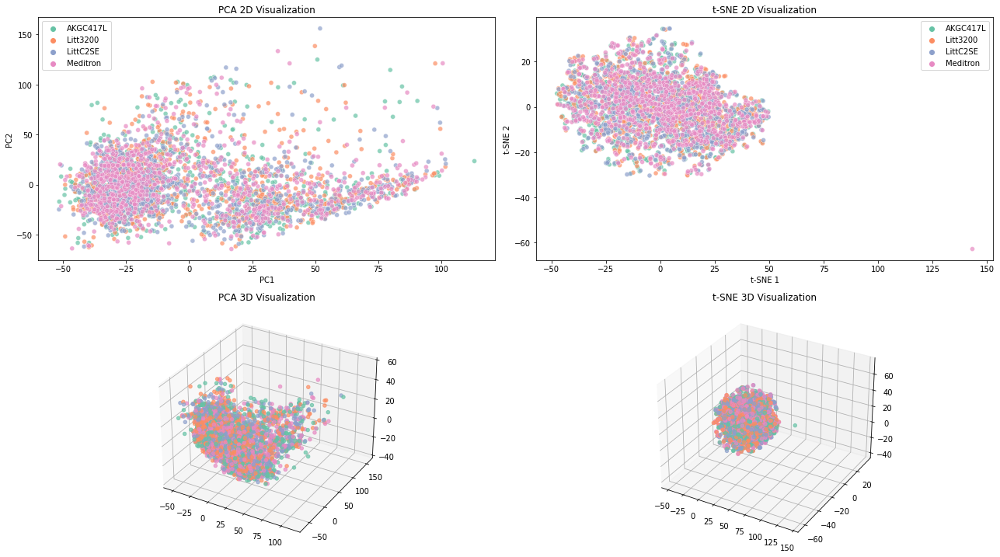

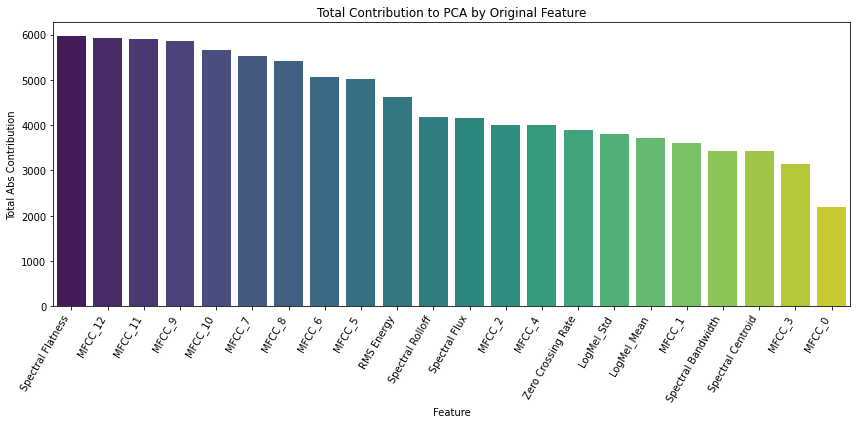

In [75]:
from utils.statistics_and_visuals import perform_pca_and_tsne

# Load the corrected training set data
training_features = np.load("training_features_fda.npy")  
device_labels = np.load("training_devices.npy")   

# Count samples per device
device_counts = Counter(device_labels)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(device_labels):
    training_features_dev = training_features[device_labels == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

perform_pca_and_tsne(
    feature_matrix=balanced_training_features,
    labels=balanced_device_labels,
    pca_components=0.95, # Keep 95% of variance
    tsne_components=3,
    perplexity=30,
    n_features=N_FEATURES,
    feature_names=FEATURE_NAMES
)

In [74]:
# Load the corrected training set data
training_features = np.load("training_features_fda.npy")  
device_labels = np.load("training_devices.npy")   

# Count samples per device
device_counts = Counter(device_labels)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(device_labels):
    training_features_dev = training_features[device_labels == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

le = LabelEncoder()
y = le.fit_transform(balanced_device_labels)
device_names = le.classes_

scaler = StandardScaler()
X = scaler.fit_transform(balanced_training_features)

clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Cross-validation 
scores = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')

# Evaluation
print("Accuracy per fold:", np.round(scores, 4))
print("Mean accuracy: {:.4f} ± {:.4f}".format(scores.mean(), scores.std()))

Accuracy per fold: [0.2588 0.2461 0.3    0.2761 0.2592]
Mean accuracy: 0.2680 ± 0.0186


#### **LABEL CLASSIFIER**

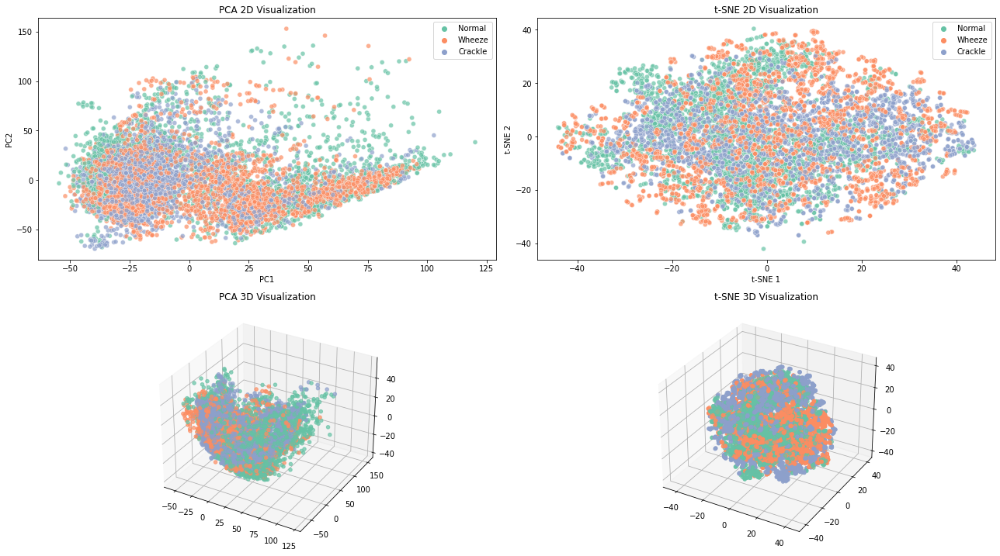

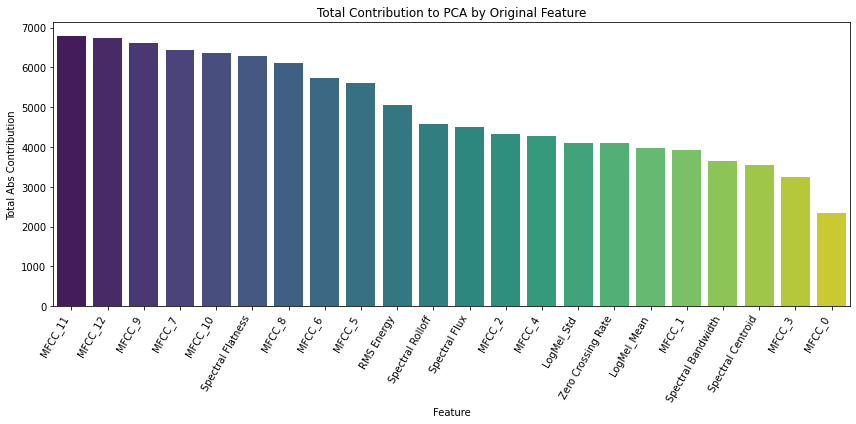

In [77]:
from utils.statistics_and_visuals import perform_pca_and_tsne

# Load the corrected training set data
training_features = np.load("training_features_fda.npy")  
class_labels = np.load("training_labels_fda.npy")  

# Keep only Normal, Crackle and Wheeze cycles
mask = np.isin(class_labels, ["Normal", "Crackle", "Wheeze"])
X = training_features[mask]
y = class_labels[mask]

perform_pca_and_tsne(
    feature_matrix=X,
    labels=y,
    pca_components=0.95, # Keep 95% of variance
    tsne_components=3,
    perplexity=30,
    n_features=N_FEATURES,
    feature_names=FEATURE_NAMES
)


Fold 1 Classification Report:
              precision    recall  f1-score   support

     Crackle       0.57      0.65      0.61       373
      Normal       0.71      0.75      0.73       729
      Wheeze       0.45      0.24      0.32       177

    accuracy                           0.65      1279
   macro avg       0.58      0.55      0.55      1279
weighted avg       0.64      0.65      0.64      1279

Confusion matrix:
[[242 123   8]
 [140 544  45]
 [ 40  94  43]]

Fold 2 Classification Report:
              precision    recall  f1-score   support

     Crackle       0.58      0.64      0.61       373
      Normal       0.71      0.77      0.74       729
      Wheeze       0.49      0.25      0.33       177

    accuracy                           0.66      1279
   macro avg       0.60      0.55      0.56      1279
weighted avg       0.65      0.66      0.65      1279

Confusion matrix:
[[238 125  10]
 [134 559  36]
 [ 35  98  44]]

Fold 3 Classification Report:
              pre

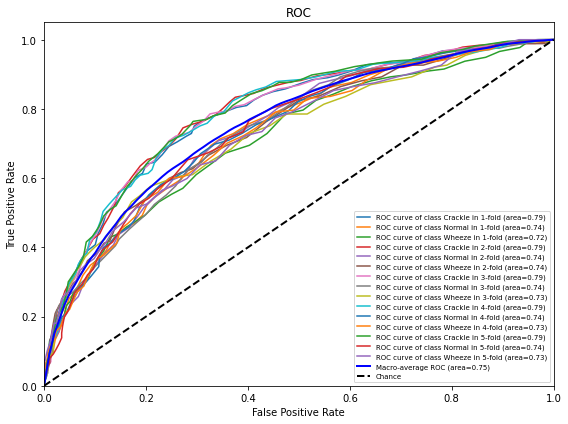

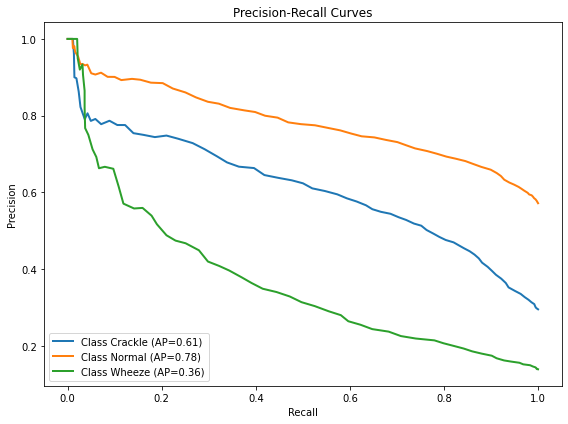


=== Overall Classification Report ===
              precision    recall  f1-score   support

     Crackle       0.57      0.64      0.61      1865
      Normal       0.71      0.75      0.73      3645
      Wheeze       0.46      0.24      0.32       885

    accuracy                           0.65      6395
   macro avg       0.58      0.55      0.55      6395
weighted avg       0.64      0.65      0.64      6395



In [ ]:
from utils.metrics import evaluate_multiclass_random_forest

X_train = np.load("training_features_fda.npy")
y_train = np.load("training_labels_fda.npy")
X_test = np.load("test_features_fda.npy")
y_test = np.load("test_labels_fda.npy")

evaluate_multiclass_random_forest(
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test
)

### **DANN**


=== Summary of Grid Search ===
Lambda: 0.1 | Best Total Loss: 0.1174
Lambda: 0.3 | Best Total Loss: 1.2164
Lambda: 0.5 | Best Total Loss: 1.8532
Lambda: 0.7 | Best Total Loss: 2.2261
Lambda: 0.9 | Best Total Loss: 2.5437
Lambda: 1.0 | Best Total Loss: 2.7432


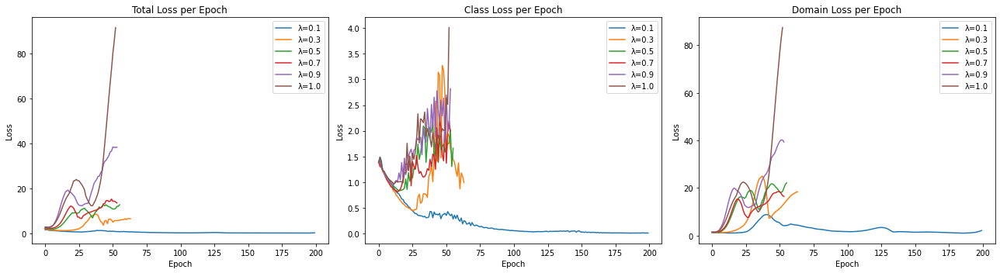

In [ ]:
from domain_adaptation_algorithms.dann import *

# === Load and Prepare Data ===
x_train = np.load("training_features.npy")
y_train = np.load("training_labels.npy", allow_pickle=True)
d_train = np.load("training_devices.npy", allow_pickle=True)

x_test = np.load("testing_features.npy")
y_test = np.load("testing_labels.npy", allow_pickle=True)
d_test = np.load("testing_devices.npy", allow_pickle=True)

scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

le_class = LabelEncoder()
le_domain = LabelEncoder()
y_train_enc = le_class.fit_transform(y_train)
y_test_enc = le_class.transform(y_test)

d_all = np.concatenate([d_train, d_test])
d_all_enc = le_domain.fit_transform(d_all)
d_train_enc = d_all_enc[:len(d_train)]
d_test_enc = d_all_enc[len(d_train):]

X_train_tensor = torch.tensor(x_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_enc, dtype=torch.long)
d_train_tensor = torch.tensor(d_train_enc, dtype=torch.long)

X_test_tensor = torch.tensor(x_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_enc, dtype=torch.long)
d_test_tensor = torch.tensor(d_test_enc, dtype=torch.long)

# === Grid Search ===
lambda_values = [0.1, 0.3, 0.5, 0.7, 0.9, 1.0]
epochs = 200
patience = 50

input_dim = x_train.shape[1]
num_classes = len(np.unique(y_train_enc))
num_domains = len(np.unique(d_all_enc))

loss_fn_domain = nn.CrossEntropyLoss()
loss_fn_class = nn.CrossEntropyLoss()

results = []
all_losses = {}

for lambda_max in lambda_values:
    feature_extractor = FeatureExtractor(input_dim)
    domain_classifier = DomainClassifier(128, num_domains)
    label_classifier = LabelClassifier(bottleneck_dim=128, num_classes=num_classes)

    optimizer = torch.optim.Adam(
        list(feature_extractor.parameters()) +
        list(domain_classifier.parameters()) +
        list(label_classifier.parameters()),
        lr=1e-3
    )

    best_loss = float('inf')
    epochs_no_improve = 0

    total_losses = []
    class_losses = []
    domain_losses = []

    for epoch in range(epochs):
        feature_extractor.train()
        label_classifier.train()
        domain_classifier.train()

        alpha = 2 / (1 + np.exp(-10 * epoch / epochs)) - 1

        features = feature_extractor(X_train_tensor)
        class_logits = label_classifier(features)
        domain_logits = domain_classifier(features, alpha=alpha)

        loss_class = loss_fn_class(class_logits, y_train_tensor)
        loss_domain = loss_fn_domain(domain_logits, d_train_tensor)
        loss_total = loss_class + lambda_max * loss_domain

        optimizer.zero_grad()
        loss_total.backward()
        optimizer.step()

        total_losses.append(loss_total.item())
        class_losses.append(loss_class.item())
        domain_losses.append(loss_domain.item())

        if loss_total.item() < best_loss:
            best_loss = loss_total.item()
            epochs_no_improve = 0
            torch.save(feature_extractor.state_dict(), f"best_dann_feature_extractor_lambda{lambda_max:.1f}.pth")
        else:
            epochs_no_improve += 1

        if epochs_no_improve >= patience:
            break

    all_losses[lambda_max] = {
        'total': total_losses,
        'class': class_losses,
        'domain': domain_losses
    }

    results.append((lambda_max, best_loss))

# === Summary ===
print("\n=== Summary of Grid Search ===")
for lmbd, loss in results:
    print(f"Lambda: {lmbd:.1f} | Best Total Loss: {loss:.4f}")

# === Plot losses ===
plt.figure(figsize=(18, 5))

for i, loss_type in enumerate(['total', 'class', 'domain']):
    plt.subplot(1, 3, i+1)
    for lambda_max in lambda_values:
        losses = all_losses[lambda_max][loss_type]
        plt.plot(losses, label=f"λ={lambda_max}")
    plt.title(f"{loss_type.capitalize()} Loss per Epoch")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

plt.tight_layout()
plt.show()

In [81]:
# Extract Domain-Invariant Features and load them on classifier
feature_extractor.load_state_dict(torch.load("best_dann_feature_extractor_lambda0.3.pth"))
feature_extractor.eval()
with torch.no_grad():
    X_train_dann = feature_extractor(X_train_tensor).numpy()
    X_test_dann = feature_extractor(X_test_tensor).numpy()

np.save("training_features_dann.npy", X_train_dann)
np.save("test_features_dann.npy", X_test_dann)

In [ ]:
from utils.metrics import mean_wasserstein

# Load the features before and after spectrum correction
x_before = np.load("training_features.npy")                  
x_after = np.load("training_features_dann.npy")        
devices = np.load("training_devices.npy", allow_pickle=True) 

results = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue

    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    # Calculate the Wasserstein  distance of the 3 remaining devices from AKGC417L 
    dist_before = mean_wasserstein(X_src_before, X_trg_before)
    dist_after  = mean_wasserstein(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"Wasserstein distance before: {vals['before']:.4f}")
    print(f"Wasserstein distance after:  {vals['after']:.4f}")
    print(f"Wasserstein relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[LittC2SE → AKGC417L]
Wasserstein distance before: 17.7895
Wasserstein distance after:  1.5535
Wasserstein relevant reduction: 91.27%

[Litt3200 → AKGC417L]
Wasserstein distance before: 23.9789
Wasserstein distance after:  3.8064
Wasserstein relevant reduction: 84.13%

[Meditron → AKGC417L]
Wasserstein distance before: 8.9944
Wasserstein distance after:  1.1805
Wasserstein relevant reduction: 86.88%



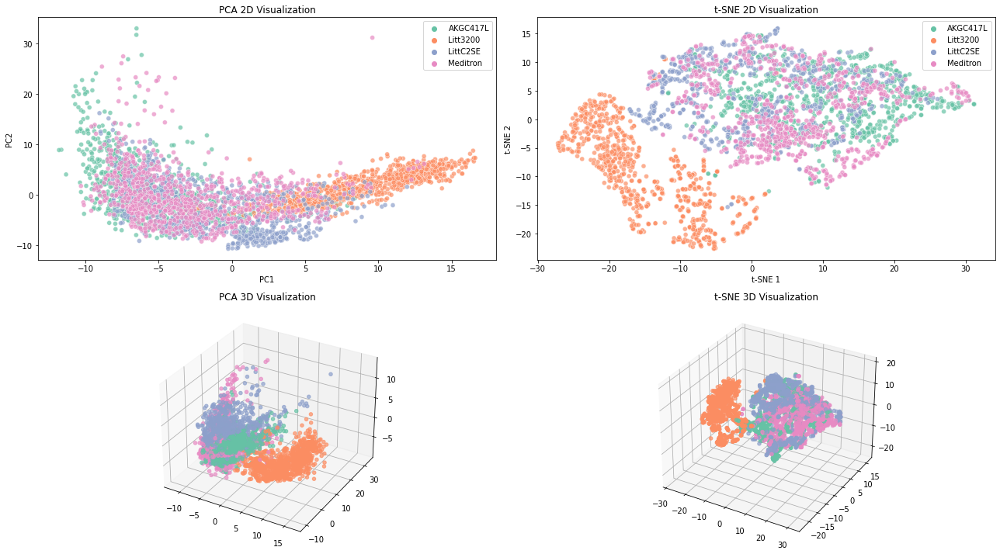

In [33]:
from utils.statistics_and_visuals import perform_pca_and_tsne

# Load the corrected training set data
training_features = np.load("training_features_dann.npy")  
device_labels = np.load("training_devices.npy")   

# Count samples per device
device_counts = Counter(device_labels)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(device_labels):
    training_features_dev = training_features[device_labels == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

perform_pca_and_tsne(
    feature_matrix=balanced_training_features,
    labels=balanced_device_labels,
    pca_components=0.95, # Keep 95% of variance
    tsne_components=3,
    perplexity=30,
    n_features=N_FEATURES,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)

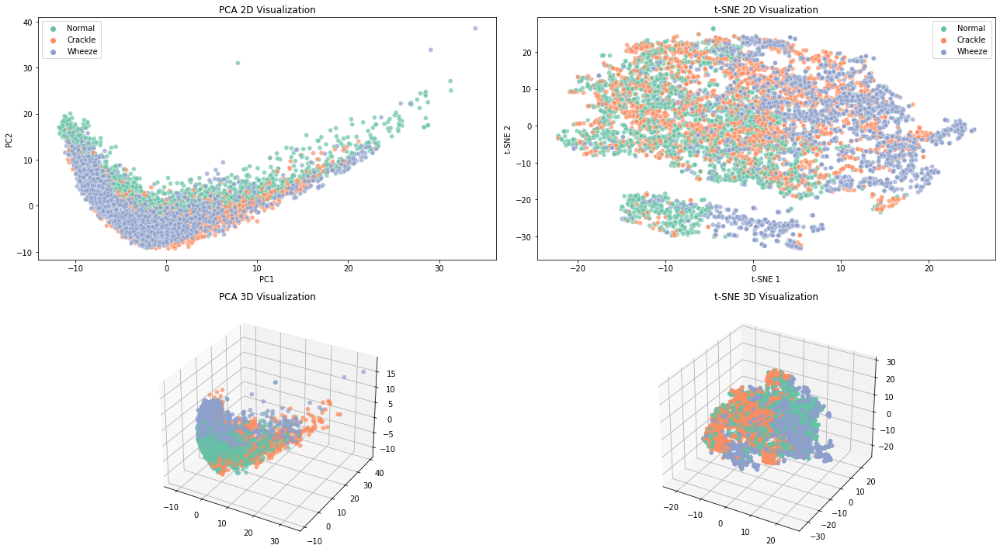

In [32]:
from utils.statistics_and_visuals import perform_pca_and_tsne

# Load the corrected training set data
training_features = np.load("training_features_dann.npy")  
class_labels = np.load("training_labels.npy")  

# Keep only Normal, Crackle and Wheeze cycles
mask = np.isin(class_labels, ["Normal", "Crackle", "Wheeze"])
X = training_features[mask]
y = class_labels[mask]

perform_pca_and_tsne(
    feature_matrix=X,
    labels=y,
    pca_components=0.95, # Keep 95% of variance
    tsne_components=3,
    perplexity=30,
    n_features=N_FEATURES,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)


Fold 1 Classification Report:
              precision    recall  f1-score   support

     Crackle       0.61      0.55      0.58       373
      Normal       0.70      0.78      0.74       729
      Wheeze       0.44      0.31      0.36       177

    accuracy                           0.65      1279
   macro avg       0.58      0.55      0.56      1279
weighted avg       0.64      0.65      0.64      1279

Confusion matrix:
[[206 147  20]
 [107 571  51]
 [ 22 100  55]]

Fold 2 Classification Report:
              precision    recall  f1-score   support

     Crackle       0.60      0.56      0.58       373
      Normal       0.69      0.76      0.72       729
      Wheeze       0.46      0.33      0.38       177

    accuracy                           0.64      1279
   macro avg       0.58      0.55      0.56      1279
weighted avg       0.63      0.64      0.64      1279

Confusion matrix:
[[210 149  14]
 [121 555  53]
 [ 20  99  58]]

Fold 3 Classification Report:
              pre

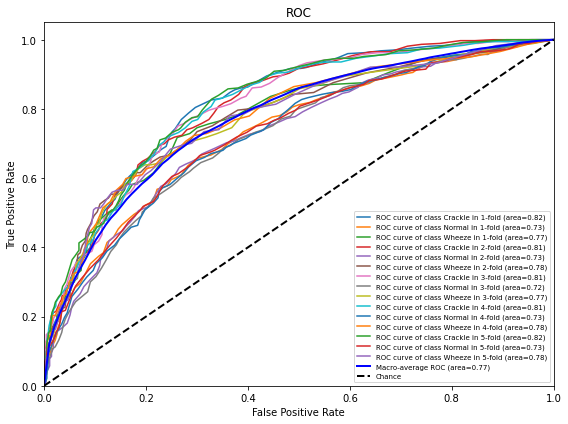

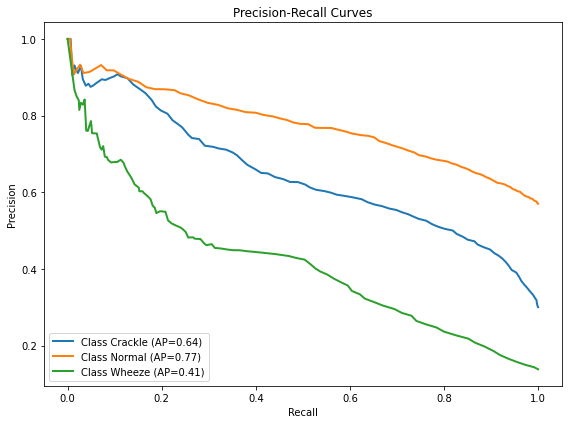


=== Overall Classification Report ===
              precision    recall  f1-score   support

     Crackle       0.60      0.55      0.57      1865
      Normal       0.69      0.77      0.73      3645
      Wheeze       0.45      0.31      0.37       885

    accuracy                           0.64      6395
   macro avg       0.58      0.54      0.56      6395
weighted avg       0.63      0.64      0.63      6395



In [ ]:
from utils.metrics import evaluate_multiclass_random_forest

X_train = np.load("training_features_dann.npy")
y_train = np.load("training_labels.npy")
X_test = np.load("test_features_dann.npy")
y_test = np.load("testing_labels.npy")

evaluate_multiclass_random_forest(
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test
)

## **RESULTS**

| Method                                | Accuracy | Macro F1 | Weighted F1 | Macro AUC | Weighted Precision | Weighted Recall |
|---------------------------------------|----------|----------|--------------|-----------|---------------------|------------------|
| Spectrum Correction                   | 0.65     | 0.54     | 0.63         | 0.75      | 0.63                | 0.65             |
| Fourier Domain Adaptation (FDA)       | 0.65     | 0.55     | 0.64         | 0.75      | 0.64               | 0.65             |
| Domain-Adversarial Neural Network     | 0.64     | 0.56    | 0.63         | 0.77     | 0.58                | 0.63             |

**1. Spectrum Correction**

This method standardizes the frequency response of all recordings to match a reference device (AKGC417L) using spectral ratios. It reduces device-specific variability at the signal level.
Impact: Improves feature consistency across devices, leading to moderate gains in classification accuracy, especially when models are trained on mixed-device data.

**2. Fourier Domain Adaptation (FDA)**

FDA transforms the spectrograms of target-domain samples by injecting low-frequency amplitude components from the reference device. It aligns the global spectral statistics without changing the high-frequency content.
Impact: Enhances domain invariance in the input space, improving classification robustness across unseen devices. Often outperforms spectrum correction in domain generalization.

**3. Domain-Adversarial Neural Network (DANN)**

DANN uses a neural network with a gradient reversal layer to extract features that are both discriminative for classification and invariant to domain (device) differences.
Impact: Provides the best domain adaptation by learning a shared feature space. Shows the highest classification performance in cross-device scenarios, especially when combined with deep embeddings.

Based on the evaluation metrics in the comparison table, we can draw the following conclusions:

**1. Overall Accuracy**
All three methods achieve a comparable level of overall accuracy (~0.64–0.65), indicating that they are equally effective at general classification performance when evaluated across all domains.

**2. Macro F1**
The Domain-Adversarial Neural Network (DANN) achieves the highest Macro F1-score (0.56), which suggests it performs more consistently across all classes — including less represented or more difficult classes like "Wheeze". This metric is particularly important when class balance is uneven.

**3. Weighted F1**
Fourier Domain Adaptation (FDA) slightly outperforms the others in Weighted F1-score (0.64), indicating better performance when class frequency is taken into account. Spectrum Correction follows closely with 0.63, and DANN also reaches 0.63, confirming that all methods are strong performers overall.

**4. Macro AUC**
DANN again leads in Macro AUC (0.77), suggesting it achieves better class separation across the entire ROC curve — important for real-world deployment where class thresholds may vary.

**5. Weighted Precision & Recall**

- FDA has the best Weighted Precision (0.64), making it the most reliable when minimizing false positives.

- Spectrum Correction and FDA both reach the top in Weighted Recall (0.65), meaning they are equally effective in minimizing false negatives.

- DANN, while slightly lower in these two metrics, makes up for it by achieving better macro-level performance, which may matter more in medical or imbalanced-class scenarios.

### **DIFE**

In [ ]:
from domain_adaptation_algorithms.dife import *

# Load data
x_train = np.load("training_features.npy")
y_train = np.load("training_labels.npy", allow_pickle=True)
d_train = np.load("training_devices.npy", allow_pickle=True)
x_test = np.load("testing_features.npy")
y_test = np.load("testing_labels.npy", allow_pickle=True)
d_test = np.load("testing_devices.npy", allow_pickle=True)

# Preprocess
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_test_enc = le.transform(y_test)

X_train_tensor = torch.tensor(x_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_enc, dtype=torch.long)
X_test_tensor = torch.tensor(x_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_enc, dtype=torch.long)

# Datasets
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=256, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=256, shuffle=True)

# Init models
input_dim = x_train.shape[1]
num_classes = len(np.unique(y_train_enc))
feat_extractor = FeatureExtractor(input_dim, output_dim=128)
classifier = Classifier(128, num_classes)
disc_loss_fn = CenterMarginLoss(num_classes, feat_dim=128)

optimizer = torch.optim.Adam(list(feat_extractor.parameters()) + list(classifier.parameters()) + list(disc_loss_fn.parameters()), lr=1e-3)

# Early Stopping
best_val_loss = float('inf')
patience = 20
counter = 0

# Training loop
for epoch in range(200):
    feat_extractor.train()
    classifier.train()
    total_epoch_loss = 0

    for (xb_s, yb_s), (xb_t, _) in zip(train_loader, test_loader):
        zs = feat_extractor(xb_s)
        zt = feat_extractor(xb_t)
        with torch.no_grad():
            pseudo_yt = classifier(zt).argmax(1)

        loss, l_cls, l_align, l_disc = compute_dife_loss(zs, yb_s, zt, pseudo_yt, num_classes, classifier, disc_loss_fn)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_epoch_loss += loss.item()

    avg_epoch_loss = total_epoch_loss / len(train_loader)
    print(f"Epoch {epoch+1:02d} | Avg Loss: {avg_epoch_loss:.4f} | Cls: {l_cls:.4f} | Align: {l_align:.4f} | Disc: {l_disc:.4f}")

    # Early stopping condition
    if avg_epoch_loss < best_val_loss:
        best_val_loss = avg_epoch_loss
        counter = 0
        torch.save(feat_extractor.state_dict(), "best_dife_feature_extractor.pth")
    else:
        counter += 1
        if counter >= patience:
            print("Early stopping triggered.")
            break

# Save aligned features
feat_extractor.load_state_dict(torch.load("best_dife_feature_extractor.pth"))
feat_extractor.eval()
with torch.no_grad():
    X_train_aligned = feat_extractor(X_train_tensor).numpy()
    X_test_aligned = feat_extractor(X_test_tensor).numpy()
np.save("training_features_dife.npy", X_train_aligned)
np.save("test_features_dife.npy", X_test_aligned)

Epoch 01 | Avg Loss: 13.6329 | Cls: 1.3758 | Align: 0.1809 | Disc: 119.9886
Epoch 02 | Avg Loss: 9.3579 | Cls: 1.3153 | Align: 0.0680 | Disc: 92.0214
Epoch 03 | Avg Loss: 8.1605 | Cls: 1.1946 | Align: 0.0573 | Disc: 83.5723
Epoch 04 | Avg Loss: 7.1791 | Cls: 0.9711 | Align: 0.0858 | Disc: 69.4912
Epoch 05 | Avg Loss: 6.3184 | Cls: 0.7767 | Align: 0.1300 | Disc: 62.7681
Epoch 06 | Avg Loss: 5.5757 | Cls: 0.6244 | Align: 0.0954 | Disc: 54.7189
Epoch 07 | Avg Loss: 5.0022 | Cls: 0.5323 | Align: 0.1394 | Disc: 49.6833
Epoch 08 | Avg Loss: 4.5436 | Cls: 0.5256 | Align: 0.0859 | Disc: 49.4948
Epoch 09 | Avg Loss: 4.2081 | Cls: 0.4504 | Align: 0.0893 | Disc: 45.4075
Epoch 10 | Avg Loss: 3.9484 | Cls: 0.3789 | Align: 0.0933 | Disc: 41.2706
Epoch 11 | Avg Loss: 3.5450 | Cls: 0.3448 | Align: 0.1156 | Disc: 37.3921
Epoch 12 | Avg Loss: 3.2493 | Cls: 0.2816 | Align: 0.1045 | Disc: 33.4394
Epoch 13 | Avg Loss: 3.0258 | Cls: 0.3514 | Align: 0.0798 | Disc: 35.2965
Epoch 14 | Avg Loss: 3.0566 | Cls: 0

In [ ]:
from utils.metrics import mean_wasserstein
results = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue

    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    # Calculate the Wasserstein  distance of the 3 remaining devices from AKGC417L 
    dist_before = mean_wasserstein(X_src_before, X_trg_before)
    dist_after  = mean_wasserstein(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"Wasserstein distance before: {vals['before']:.4f}")
    print(f"Wasserstein distance after:  {vals['after']:.4f}")
    print(f"Wasserstein relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[LittC2SE → AKGC417L]
Wasserstein distance before: 17.7895
Wasserstein distance after:  0.2027
Wasserstein relevant reduction: 98.86%

[Litt3200 → AKGC417L]
Wasserstein distance before: 23.9789
Wasserstein distance after:  0.3113
Wasserstein relevant reduction: 98.70%

[Meditron → AKGC417L]
Wasserstein distance before: 8.9944
Wasserstein distance after:  0.2132
Wasserstein relevant reduction: 97.63%



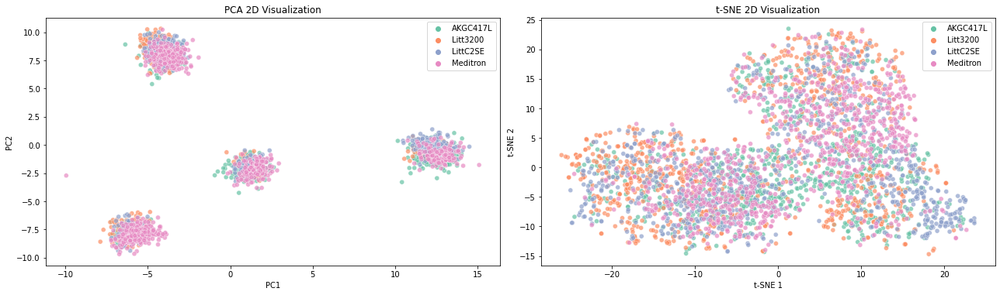

In [ ]:
from utils.statistics_and_visuals import perform_pca_and_tsne

# Load the corrected training set data
training_features = np.load("training_features_dife.npy")  
device_labels = np.load("training_devices.npy")   

# Count samples per device
device_counts = Counter(device_labels)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(device_labels):
    training_features_dev = training_features[device_labels == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

perform_pca_and_tsne(
    feature_matrix=balanced_training_features,
    labels=balanced_device_labels,
    pca_components=0.95, # Keep 95% of variance
    tsne_components=3,
    perplexity=30,
    n_features=N_FEATURES,
    feature_names=FEATURE_NAMES
)

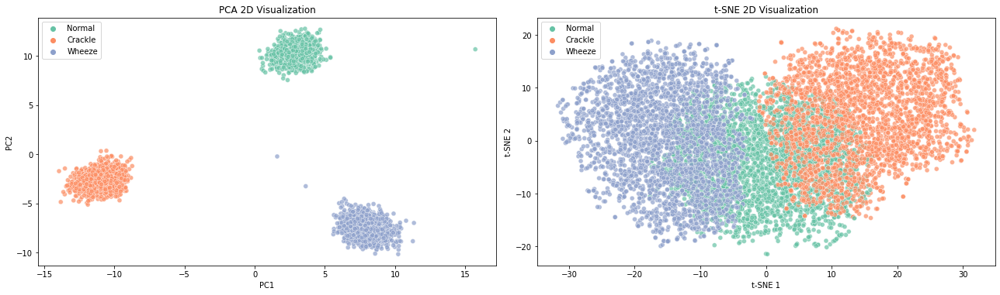

In [65]:
from utils.statistics_and_visuals import perform_pca_and_tsne

# Load the corrected training set data
training_features = np.load("training_features_dife.npy")  
class_labels = np.load("training_labels.npy")  

# Keep only Normal, Crackle and Wheeze cycles
mask = np.isin(class_labels, ["Normal", "Crackle", "Wheeze"])
X = training_features[mask]
y = class_labels[mask]

perform_pca_and_tsne(
    feature_matrix=X,
    labels=y,
    pca_components=0.95, # Keep 95% of variance
    tsne_components=3,
    perplexity=30,
    n_features=N_FEATURES,
    feature_names=FEATURE_NAMES
)


Fold 1 Classification Report:
              precision    recall  f1-score   support

     Crackle       0.54      0.47      0.51       373
      Normal       0.70      0.69      0.70       729
      Wheeze       0.38      0.50      0.43       177

    accuracy                           0.60      1279
   macro avg       0.54      0.55      0.54      1279
weighted avg       0.61      0.60      0.60      1279

Confusion matrix:
[[177 149  47]
 [127 504  98]
 [ 21  68  88]]

Fold 2 Classification Report:
              precision    recall  f1-score   support

     Crackle       0.55      0.49      0.52       373
      Normal       0.71      0.69      0.70       729
      Wheeze       0.36      0.49      0.41       177

    accuracy                           0.60      1279
   macro avg       0.54      0.56      0.55      1279
weighted avg       0.62      0.60      0.61      1279

Confusion matrix:
[[184 137  52]
 [125 503 101]
 [ 24  67  86]]

Fold 3 Classification Report:
              pre

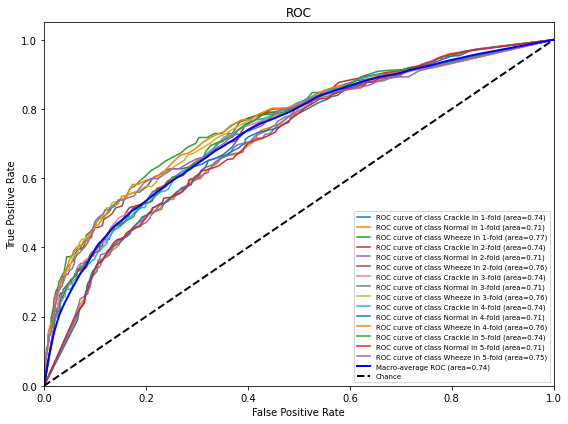

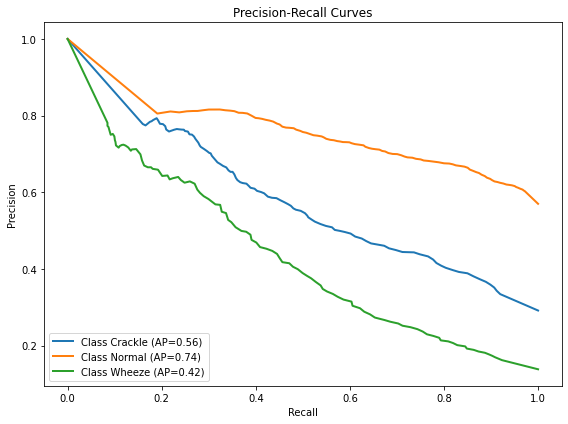


=== Overall Classification Report ===
              precision    recall  f1-score   support

     Crackle       0.55      0.48      0.51      1865
      Normal       0.70      0.70      0.70      3645
      Wheeze       0.39      0.47      0.43       885

    accuracy                           0.61      6395
   macro avg       0.54      0.55      0.55      6395
weighted avg       0.61      0.61      0.61      6395



In [ ]:
from utils.metrics import evaluate_multiclass_random_forest

X_train = np.load("training_features_dife.npy")
y_train = np.load("training_labels.npy")
X_test = np.load("test_features_dife.npy")
y_test = np.load("testing_labels.npy")

evaluate_multiclass_random_forest(
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test
)